In [1]:
import sys
formerPath = sys.path
sys.path.append('./code/')
sys.path.append('./BS/')

In [2]:
import numpy as np
import pandas as pd 
import matplotlib.pyplot as plt
import sklearn as skl


import bootstrapping
import dataSetConstruction
import backtest
import BS
import loadData
import plotTools
import SSVI


from Bisect import bisect
from newton import newton
from BSImplVol import bsimpvol

import importlib

# Load modules and external files

If you run this notebook on google colab you need to upload python scripts on the left panel.

# Loading data 

If you run this notebook on google colab you need to upload data files on the left panel.

#### From excel file :

You will find in github repository six days of data.
For each day you need to load six csv files :
- *underlying.csv* for the stock value.
- *locvol.csv* for the local volatility calibrated with tree pricing and tikhonov volatility (see Crépey (2002)).
- *dividend.csv* for dividend extracted from put-call parity.
- *discount.csv* for zero-coupon curve. 
- *dataTrain.csv* for prices and/or implied volatility used in training set.
- *dataTest.csv* for prices and/or implied volatility used in testing set.

In [3]:
workingFolder = "./data/09082001/"

Bootstrap discounting


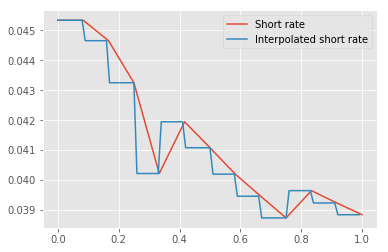

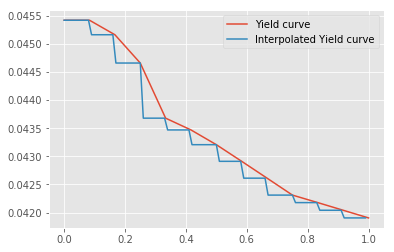

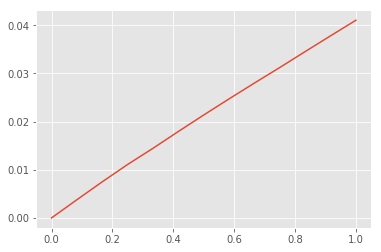

Bootstrap dividend


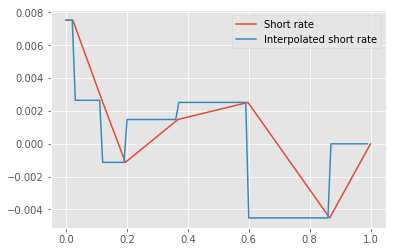

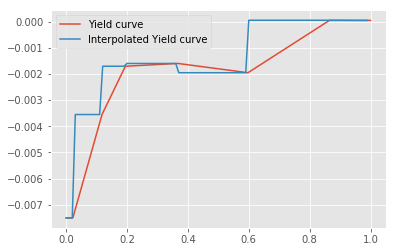

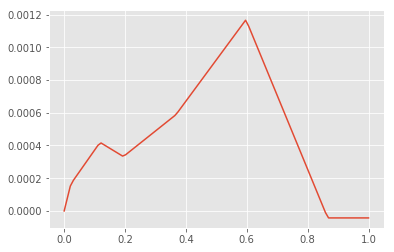

In [189]:
#Read csv files as dataFrames
trainingSet, testingSet, bootstrap, S0 = loadData.loadDataFromCSV(workingFolder,
                                                                  "9_8_2001__filterdax")

#### From Dat files

Tikhonov PDE repricing error on training set :  2.4207935408017573
Bootstrap discounting


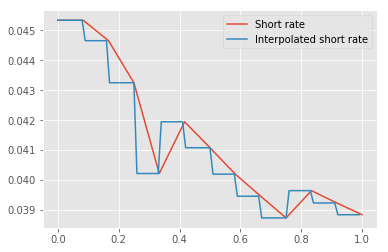

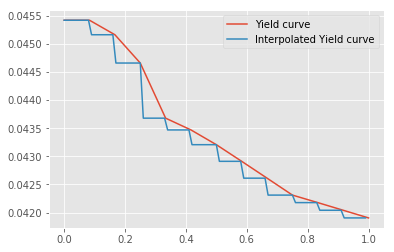

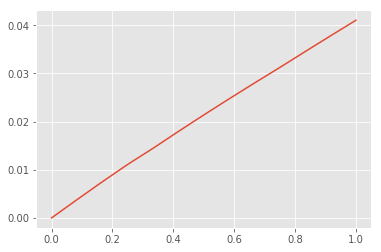

Bootstrap dividend


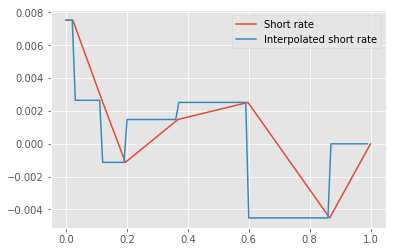

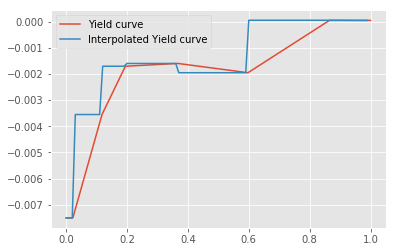

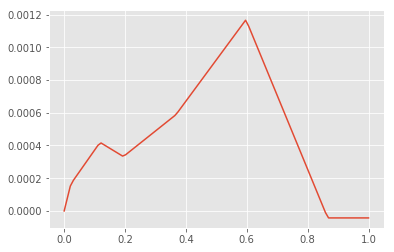

In [18]:
trainingSet, testingSet, bootstrap, S0 = loadData.loadDataFromDat(workingFolder,
                                                                  "9_8_2001__filterdax")

In [88]:
importlib.reload(loadData)

<module 'loadData' from './code/loadData.py'>

In [5]:
pd.options.mode.chained_assignment = 'raise'

#### SPX Data

We assume a piecewise constant discount short rate $r$ and a piecewise constant dividend short rate $q$.

We estimate the "zero coupon dividend" $D(T) = e^{-\int_{0}^{T} q_s ds}$ by regressing it against maturity :
$$e^{-\int_{0}^{T} q_s ds} = \frac{C(T,K) - P(T,K) + K e^{-\int_{0}^{T} r_s ds}}{S_0}$$


Then we have $\hat{q}_t = - \frac{ \log{D(\overline{T})} - \log{D(\underline{T})} }{ \overline{T} - \underline{T} }$ with $\overline{T}$ the smallest discretized maturity greater than $T$ and $\underline{T}$ the grestest discretized maturity inferior than $T$.

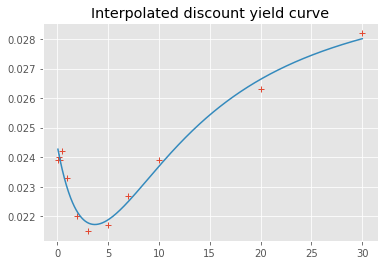

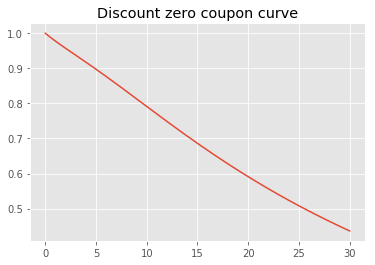

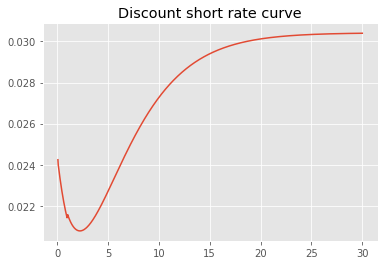

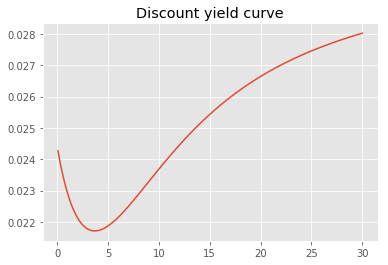

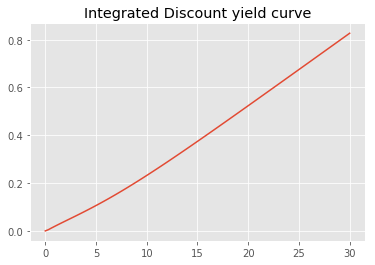

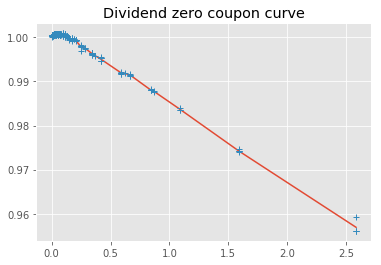

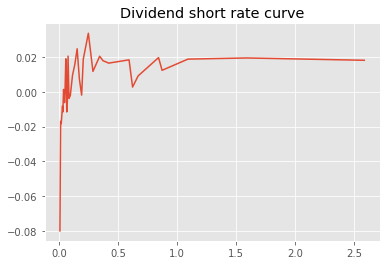

./code/bootstrapping.py:271: RuntimeWarning: invalid value encountered in double_scalars
  return (1 / x - 1) / float(t)


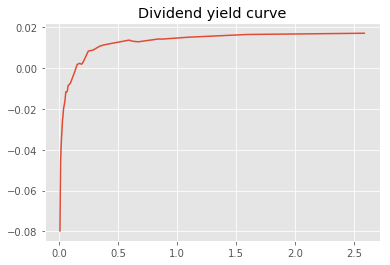

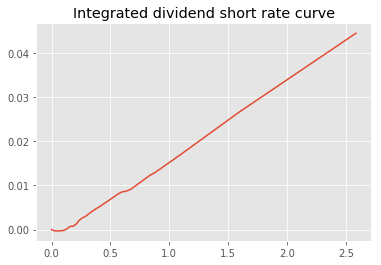

In [3]:
workingFolder = "./data/"
fileName = "Option_SPX_18_Mai_2019Feuille2.xlsm"
asOfDate = "2019-05-18"
trainingSet, testingSet, bootstrap, S0 = loadData.loadCBOTData(workingFolder, fileName, asOfDate)

In [8]:
importlib.reload(bootstrapping)

<module 'dataSetConstruction' from './code/dataSetConstruction.py'>

#### Load preformatted data

In [3]:
workingFolder = "./data/"
trainingSet, testingSet, bootstrap, S0 = loadData.loadFormattedData(workingFolder)

####  Eurostoxx data

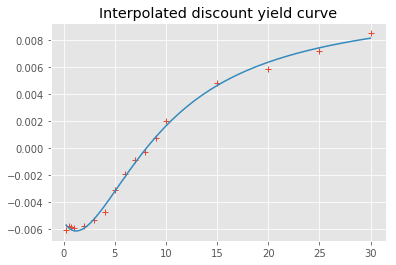

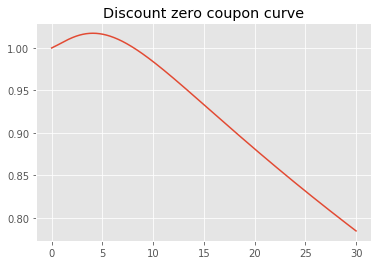

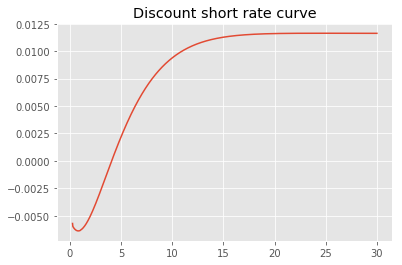

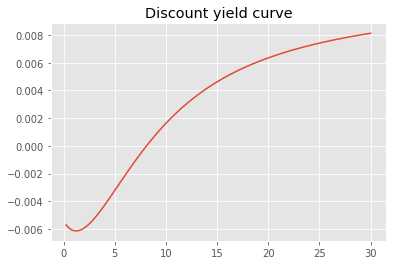

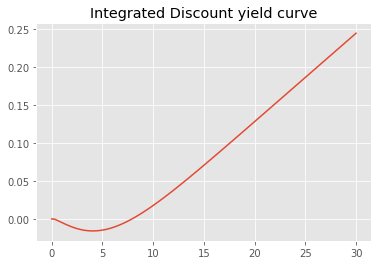

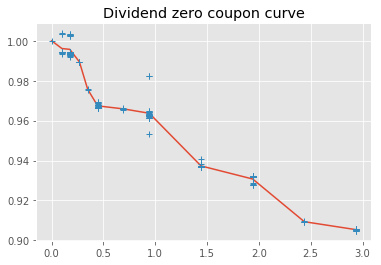

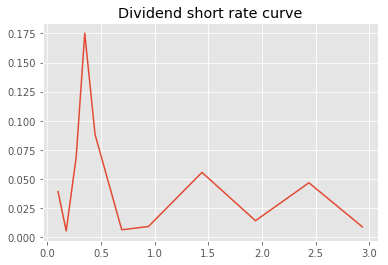

./code/bootstrapping.py:271: RuntimeWarning: invalid value encountered in double_scalars
  return (1 / x - 1) / float(t)


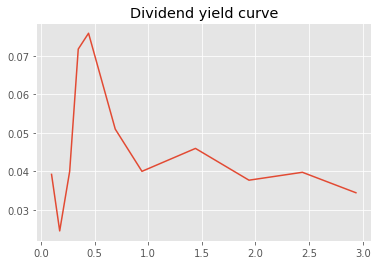

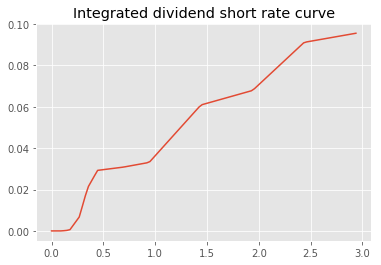

In [317]:
workingFolder = "./data/"
asOfDate = "2019-01-10"
filename = "Data_EuroStoxx50_20190110_all_for_Marc.xlsx"
trainingSet, testingSet, bootstrap, S0 = loadData.loadESXData(workingFolder, filename, asOfDate)

In [192]:
bootstrap.discountShortRate(10)

array(0.009402)

In [118]:
importlib.reload(loadData)

<module 'loadData' from './code/loadData.py'>

# Formatting data

### Boostsrapping Rate Curve


- For bootstrapping short rate $r$ and dividend rate $q$, we assume piecewise constant short rate for risk free rate and dividend i.e. 
$\exp{(-\int_{0}^{T} r_t d_t)} = \exp{(-\sum_{i} r_i h)}$ and $\exp{(\int_{0}^{T} q_t d_t)} = \exp{(\sum_{i} q_i h)}$.
- $\forall i \in \{0,..,N\}$ with $ t_0 = 0$ and $t_N = T$, we have that $\frac{\log{B(0,t_{i+1})} - \log{B(0,t_i)}}{h} = r_i$ with $B(0,T_i)$ the price of a bond expiring at time $t_i$. 
- For dividend, we just to substitute $B(0,T_i)$ with with spot action price plus dividend cash flow received until time $T_i$ i.e. $S_{t_0} + \sum\limits_i Div_{t_i}$.
- Then we linearly interpolate $r$ and $q$.
-  Linear interpolation is also used for integrals $\int_{0}^{T} q_t d_t$ and $\int_{0}^{T} r_t d_t$ in order to obtain discount factor or dividend factor. 

**riskFreeIntegral** corresponds to $I_T = \int_{0}^{T} r_u du$.
**riskFreeSpline**  corresponds to $r_u$ evaluated on a subgrid. Interpolated as step function from zero coupons

**divSpreadIntegral** corresponds to $I_T = \int_{0}^{T} q_u du$, can be negative.
**divSpline**  corresponds to $q_u$ evaluated on a subgrid, can be negative.

Training dataset is built on market prices observed on the dax.
Testing dataset is list of prices drawn from an excel provided by Stephane Crépey.
Prices come from the calibrated local volatility with tikhonov regularisation (see Crépey 2002 paper).
Implied volatitilities in both dataset are obtained from local volatility.

These curve satisfy together the call put parity.

Spot level is contained in underlying.csv

### Pricing black-scholes price

#### Change of variable

- In presence of dividend rate $d$ and risk free rate $r$ Dupire formula is :   $$\sigma^2(T,K) = 2 \frac{ \partial_T P(T,K) + (r-q) K \partial_K P(T,K) + qP(T,K)}{K² \partial_{K}^2 P(T,K)}$$ 
with Strike $K$, Maturity $T$, dividend rate $q$ and risk-free rate $r$, $P$ our pricing function. 
- We apply the following change of variable : $$ w(T,k) = \exp{(\int_{0}^{T} q_t dt)} P(T,K)$$ with $K = k \exp{(\int_{0}^{T} (r_t - q_t) dt)} $.

- Then Dupire equation becomes :  $\sigma^2(T,K) = 2 \frac{ \partial_T w(T,k)}{k² \partial_{k}^2 w(T,k)}$. 
- If we learn the mapping $v$ with a neural network then we should obtain quickly by adjoint differentiation $\partial_T w$ and $\partial_{k²}^2 w$ and therefore $\sigma$.


In [43]:
#dataSetConstruction.checkCallPutParity(pd.concat([trainingSet, testingSet]), 
#                                       S0, 
#                                       bootstrap)

ValueError: attempt to get argmax of an empty sequence

In [4]:
dataSet = trainingSet #Training set
dataSetTest = testingSet #Testing set
dataSet.head()

,,Price,Delta,Vega,Delta Strike,Gamma Strike,Theta,ChangedStrike,DividendFactor,Strike,Maturity,ImpliedVol,VegaRef,OptionType,logMoneyness,impliedTotalVariance
Strike,Maturity,,,,,,,,,,,,,,,
2200.0,0.419,9.95,-0.047968,184.678147,0.094049,-9.963916e-07,103.538454,2194.553900,0.994628,2200.0,0.419,0.2586,169.246997,-1.0,-0.264678,0.028020
2325.0,0.112,1.65,-0.015858,38.013410,0.027412,-3.969604e-05,73.268907,2323.142879,1.000111,2325.0,0.112,0.2958,15.762704,-1.0,-0.207736,0.009800
2400.0,0.093,1.60,-0.017779,38.199664,0.029753,-4.470370e-05,88.192154,2398.742294,1.000292,2400.0,0.093,0.2798,22.362901,-1.0,-0.175713,0.007281
2510.0,0.170,9.15,-0.074660,166.318158,0.128221,5.540400e-05,230.171845,2506.841932,0.999189,2510.0,0.170,0.2289,194.599716,-1.0,-0.131634,0.008907
2525.0,0.036,0.55,-0.010731,15.378146,0.016613,-5.456899e-05,87.679835,2524.212274,1.000312,2525.0,0.036,0.2893,6.408137,-1.0,-0.124728,0.003013


In [5]:
dataSetTest.head()

Price     Delta        Vega  Delta Strike  Gamma Strike  \
Strike Maturity                                                            
1700.0 0.246      0.80 -0.004171   17.445534      0.009788     -0.000018   
2300.0 0.419     14.30 -0.069169  246.251489      0.132054      0.000036   
2350.0 0.093      1.20 -0.013019   29.227795      0.022052     -0.000041   
       0.112      1.85 -0.018041   42.445051      0.030966     -0.000041   
2400.0 0.419     20.55 -0.099289  323.155078      0.185544      0.000106   

                      Theta  ChangedStrike  DividendFactor  Strike  Maturity  \
Strike Maturity                                                                
1700.0 0.246      15.329284    1697.643924        0.997527  1700.0     0.246   
2300.0 0.419     140.724773    2294.306350        0.994628  2300.0     0.419   
2350.0 0.093      66.591651    2348.768497        1.000292  2350.0     0.093   
       0.112      82.136307    2348.122910        1.000111  2350.0     0.112   
2400.0 0.419     187.583551    2394.058800        0.994628  2400.0     0.419   

                 ImpliedVol     VegaRef  OptionType  logMoneyness  \
Strike Maturity                                                     
1700.0 0.246         0.4147    0.062925        -1.0     -0.521416   
2300.0 0.419         0.2424  261.160274        -1.0     -0.220227   
2350.0 0.093         0.2959   11.271760        -1.0     -0.196766   
       0.112         0.2875   21.589857        -1.0     -0.197041   
2400.0 0.419         0.2264  368.610408        -1.0     -0.177667   

                 impliedTotalVariance  
Strike Maturity                        
1700.0 0.246                 0.042306  
2300.0 0.419                 0.024620  
2350.0 0.093                 0.008143  
       0.112                 0.009257  
2400.0 0.419                 0.021477

In [6]:
dfCurve = dataSetConstruction.savingData(bootstrap, 
                                         dataSet, 
                                         dataSetTest, 
                                         workingFolder)

Saving bootstrapping under dfCurve.csv
Saving training set under trainingDataSet.csv
Saving bootstrapping under testingDataSet.csv


In [7]:
threshold = pd.concat([dataSet, dataSetTest])["Price"].sort_values().iloc[int(0.05 * pd.concat([dataSet, dataSetTest]).shape[0])]
threshold

2.05

In [8]:
dataSet.shape

(135, 15)

In [9]:
dataSetTest.shape

(144, 15)

In [10]:
S0

2859.53

In [11]:
def getCall(df):
    return df[df["OptionType"]==1]
def getPut(df):
    return df[df["OptionType"]==-1]

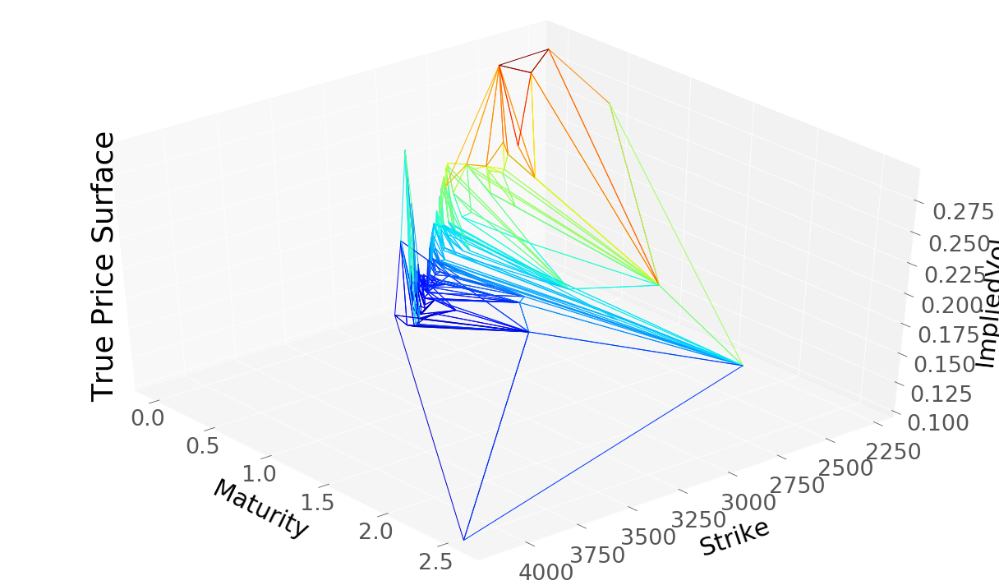

In [12]:
plotTools.plotSerie(getPut(trainingSet)["ImpliedVol"], 
                    yMin=0,
                    yMax=3*S0, 
                    Title = 'True Price Surface')

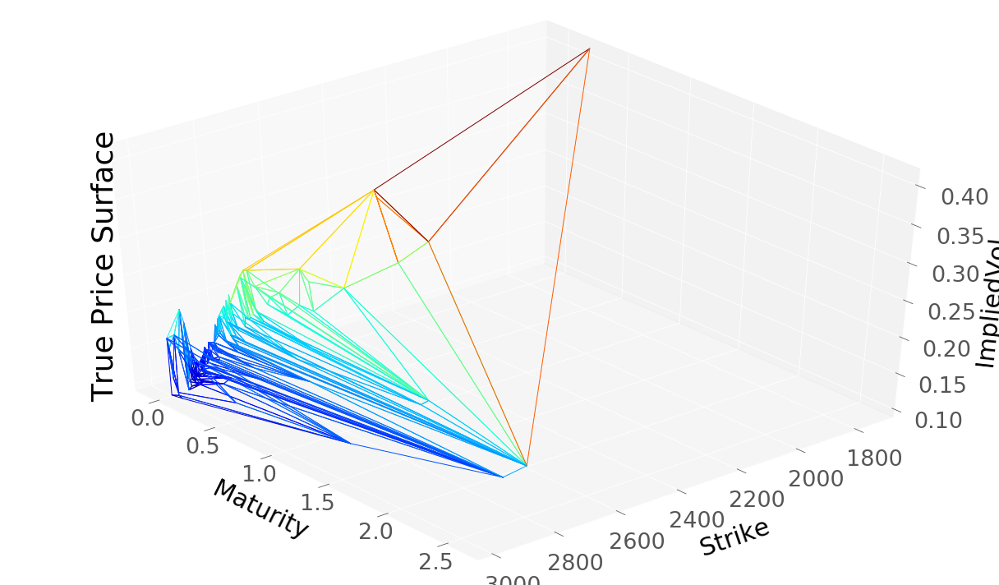

In [13]:
plotTools.plotSerie(getPut(testingSet)["ImpliedVol"], 
                    yMin=0,
                    yMax=3*S0, 
                    Title = 'True Price Surface')

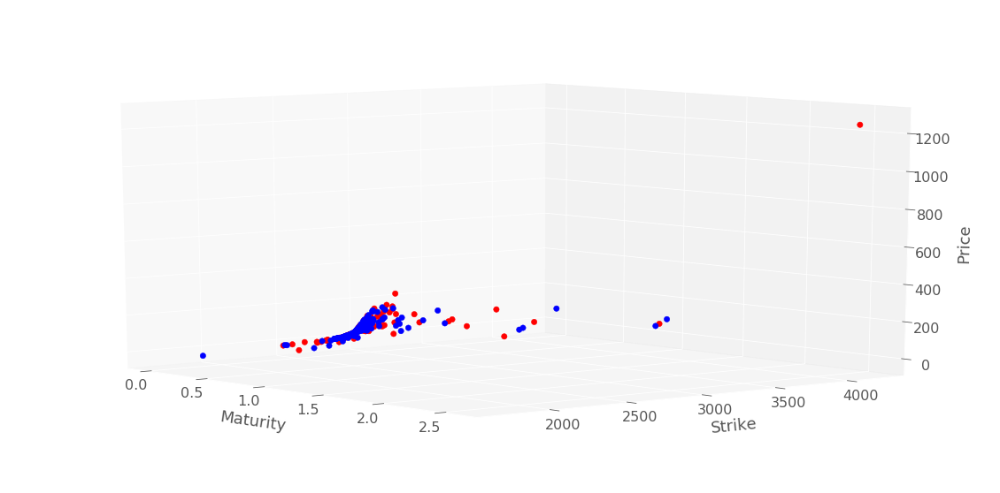

In [14]:
plotTools.plot2Series(getPut(testingSet)["Price"], 
                      getPut(trainingSet)["Price"], 
                      yMin=0,
                      yMax=3*S0, 
                      Title = 'True Price Surface')

## Scaling methods

Use min-max of scaling strike between 0 et 1 for improving stability of neural network training. 



In [15]:
activateScaling = False
transformCustom = dataSetConstruction.transformCustomMinMax if activateScaling else dataSetConstruction.transformCustomId
inverseTransform = dataSetConstruction.inverseTransformMinMax if activateScaling else dataSetConstruction.inverseTransformId
inverseTransformColumn = dataSetConstruction.inverseTransformColumnMinMax if activateScaling else dataSetConstruction.inverseTransformColumnId
inverseTransformColumnGreeks = dataSetConstruction.inverseTransformColumnGreeksMinMax if activateScaling else dataSetConstruction.inverseTransformColumnGreeksId

In [16]:
scaler = skl.preprocessing.MinMaxScaler(feature_range=(0, 1))
scaler.fit(dataSet)
scaledDataSet = transformCustom(dataSet, scaler)
scaledDataSetTest = transformCustom(dataSetTest, scaler)

In [17]:
scaledDataSet.head()

,,Price,Delta,Vega,Delta Strike,Gamma Strike,Theta,ChangedStrike,DividendFactor,Strike,Maturity,ImpliedVol,VegaRef,OptionType,logMoneyness,impliedTotalVariance
Strike,Maturity,,,,,,,,,,,,,,,
2200.0,0.419,9.95,-0.047968,184.678147,0.094049,-9.963916e-07,103.538454,2194.553900,0.994628,2200.0,0.419,0.2586,169.246997,-1.0,-0.264678,0.028020
2325.0,0.112,1.65,-0.015858,38.013410,0.027412,-3.969604e-05,73.268907,2323.142879,1.000111,2325.0,0.112,0.2958,15.762704,-1.0,-0.207736,0.009800
2400.0,0.093,1.60,-0.017779,38.199664,0.029753,-4.470370e-05,88.192154,2398.742294,1.000292,2400.0,0.093,0.2798,22.362901,-1.0,-0.175713,0.007281
2510.0,0.170,9.15,-0.074660,166.318158,0.128221,5.540400e-05,230.171845,2506.841932,0.999189,2510.0,0.170,0.2289,194.599716,-1.0,-0.131634,0.008907
2525.0,0.036,0.55,-0.010731,15.378146,0.016613,-5.456899e-05,87.679835,2524.212274,1.000312,2525.0,0.036,0.2893,6.408137,-1.0,-0.124728,0.003013


In [18]:
#Search strike for ATM option
midS0 = dataSet[dataSet.index.get_level_values("Strike") >= S0].index.get_level_values("Strike").min()

In [19]:
KMin = 0#0.7 * S0[0]
KMax = 2.0 * S0#1.3 * S0[0]


# SSVI Model

In [32]:
import SSVI


In [33]:
np.seterr(all='warn')

{'divide': 'warn', 'over': 'warn', 'under': 'ignore', 'invalid': 'warn'}

In [34]:
importlib.reload(BS)

<module 'BS' from './code/BS.py'>

In [35]:
#parameters, theta, maturities, pSSVI = SSVI.train_svi_surface(dataSet, S0)
SSVIModel = SSVI.SSVIModel(S0, bootstrap)
SSVIModel.fit(dataSet)

Contrainte :  -0.48960397568938685
Parameters of SSVI model :  [-0.82565295  0.82731826  0.5       ]
time step 25  :  2.585
Contrainte :  0.0709818132418224
time step 24  :  1.588
Contrainte :  0.06802646064907047
time step 23  :  1.09
Contrainte :  0.07019519944186503
time step 22  :  0.841
Contrainte :  0.07107393739791534
time step 21  :  0.591
Contrainte :  0.024062770300447345
time step 20  :  0.419


./code/SSVI.py:617: RuntimeWarning: invalid value encountered in sqrt
  alpha = np.sign(beta) * np.sqrt(1 / beta ** 2 - 1)
./code/SSVI.py:619: RuntimeWarning: invalid value encountered in sqrt
  (b * (-rho + np.sign(alpha) * np.sqrt(1 + alpha ** 2) - alpha * np.sqrt(1 - rho ** 2))))
./code/SSVI.py:630: RuntimeWarning: invalid value encountered in sqrt
  a = vt * tau - b * sigma * np.sqrt(1 - rho ** 2)
./code/SSVI.py:324: RuntimeWarning: invalid value encountered in less
  if any(model_total_implied_variance < before_total_implied_variance) :
./code/SSVI.py:331: RuntimeWarning: invalid value encountered in greater
  if any(model_total_implied_variance > after_total_implied_variance) :


Contrainte :  0.0717797067950875
time step 19  :  0.342
Contrainte :  0.07174590182549623
time step 18  :  0.285
Contrainte :  0.0712821390862165
time step 17  :  0.24600000000000002
Contrainte :  0.07171718102499225
time step 16  :  0.203
Contrainte :  0.07193874612091189
time step 15  :  0.18899999999999997
Contrainte :  0.07197652432069612
time step 14  :  0.17
Contrainte :  0.07186390974813273
time step 13  :  0.151
Contrainte :  0.07089701185991693
time step 12  :  0.131
Contrainte :  0.07815134031396531
time step 11  :  0.11199999999999999
Contrainte :  0.07193261604561274
time step 10  :  0.09300000000000001
Contrainte :  0.07474037540036338
time step 9  :  0.07400000000000001
Contrainte :  0.07243074743018652
time step 8  :  0.063
Contrainte :  0.07247647420229641
time step 7  :  0.055
Contrainte :  0.0719581979323417
time step 6  :  0.044000000000000004
Contrainte :  0.07523627984960002
time step 5  :  0.036000000000000004
Contrainte :  0.07166421377276533
time step 4  :  0.03

In [36]:
serie = SSVIModel.eval(dataSetTest)
serieTrain = SSVIModel.eval(dataSet)

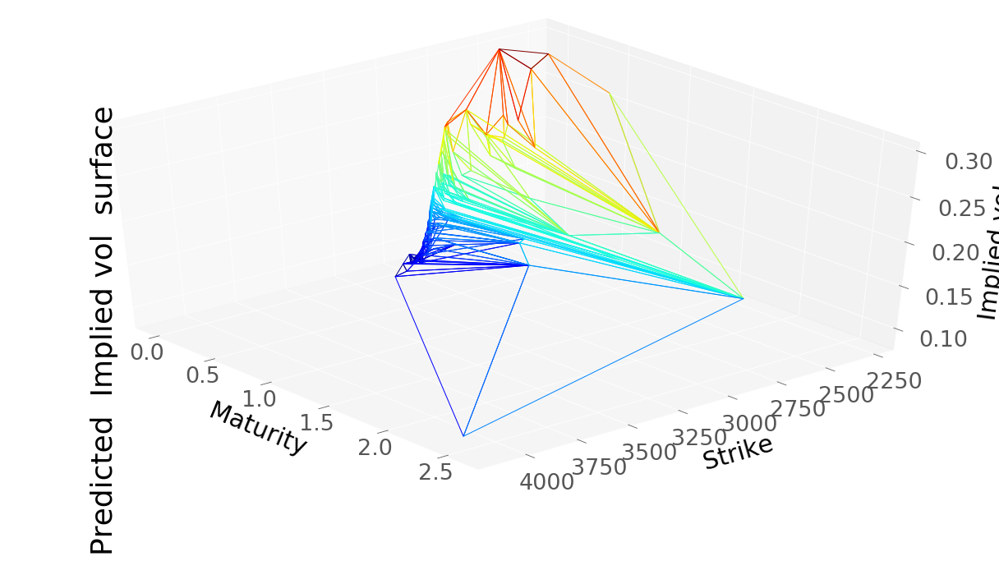

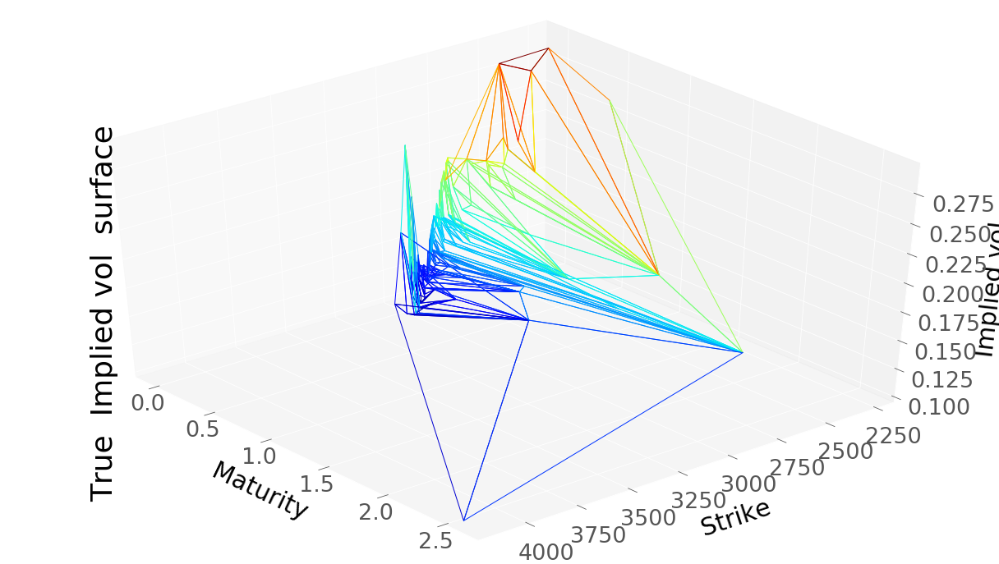

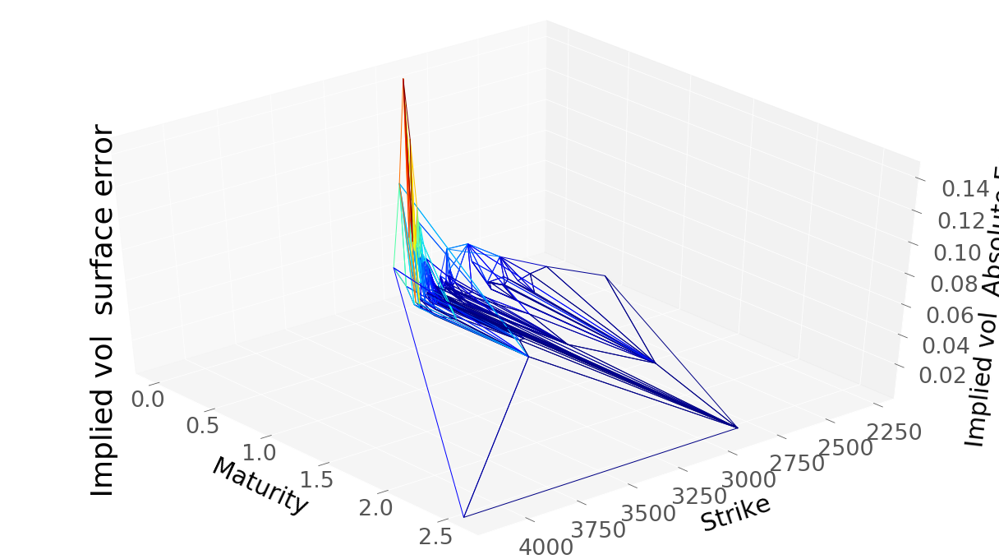

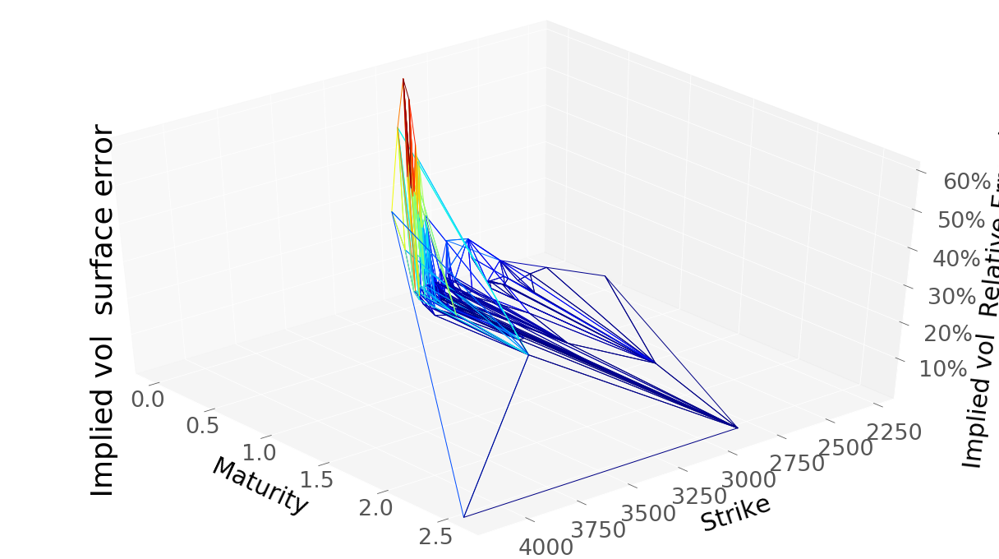

RMSE :  0.024299002080196523
RMSE Relative:  0.15263989132006228


In [37]:
keptPrices = dataSet["Price"][dataSet["Price"] >= 0.0].index
plotTools.predictionDiagnosis(plotTools.selectIndex(serieTrain, keptPrices) , 
                              plotTools.selectIndex(dataSet["ImpliedVol"], keptPrices) , 
                              " Implied vol ", 
                              yMin=KMin,
                              yMax=KMax)

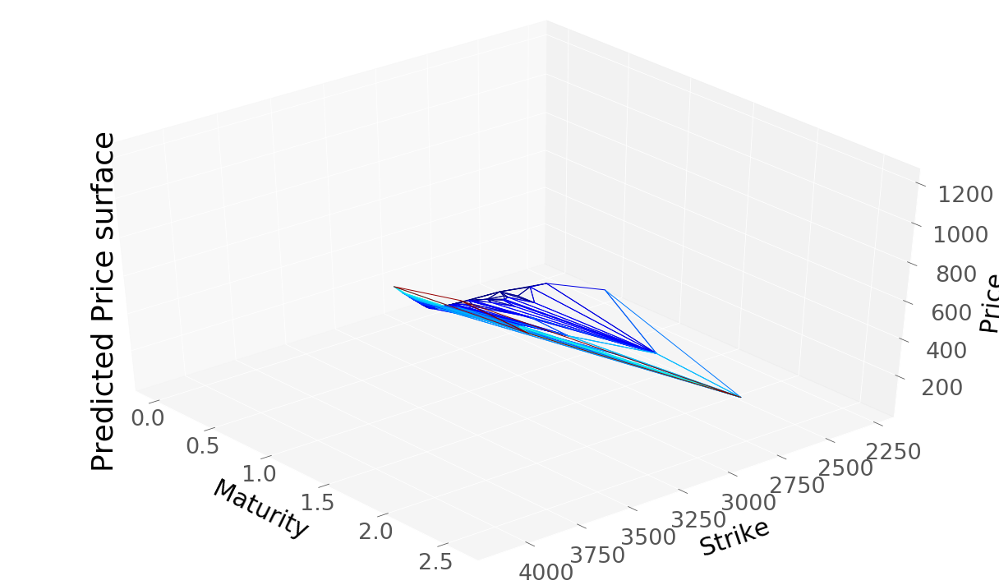

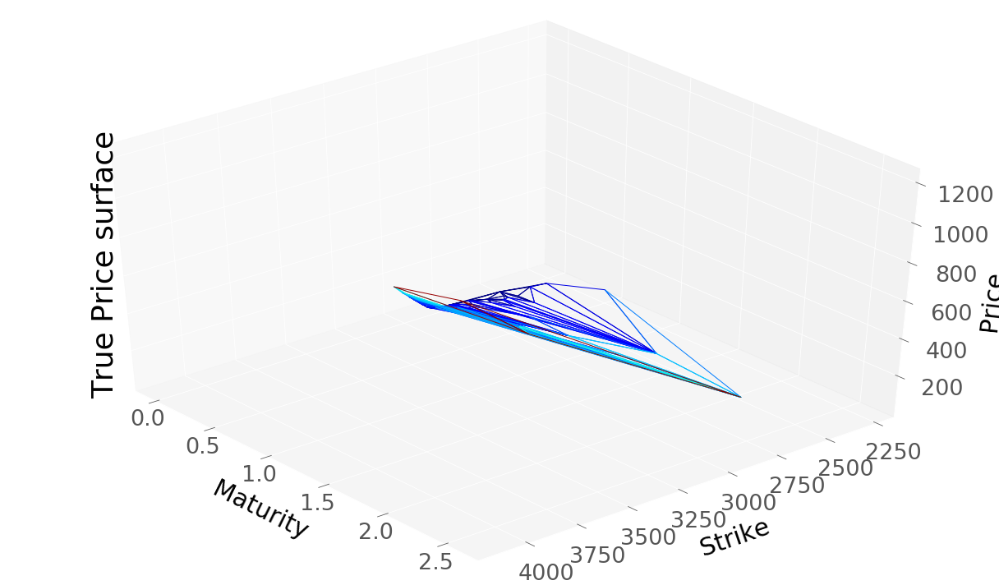

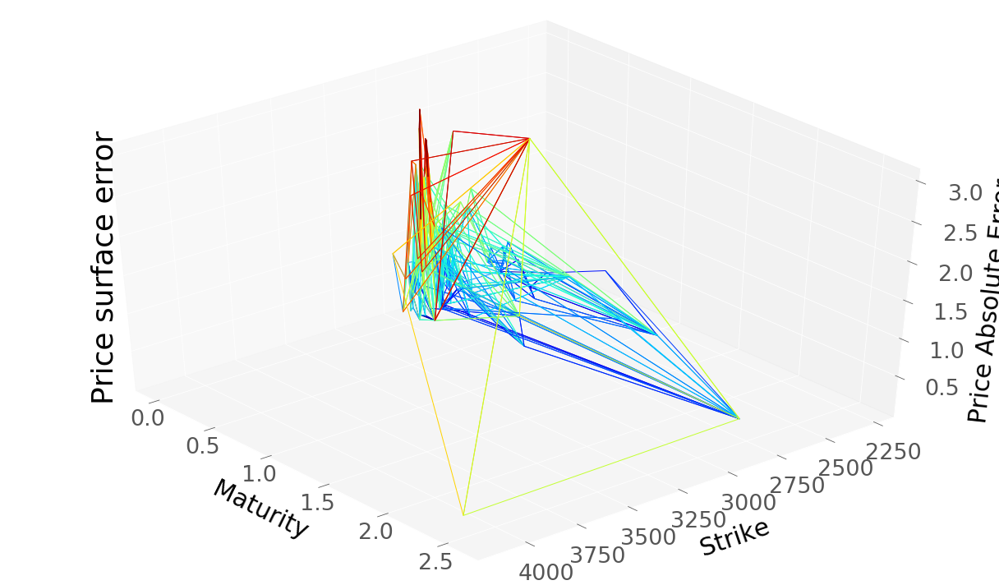

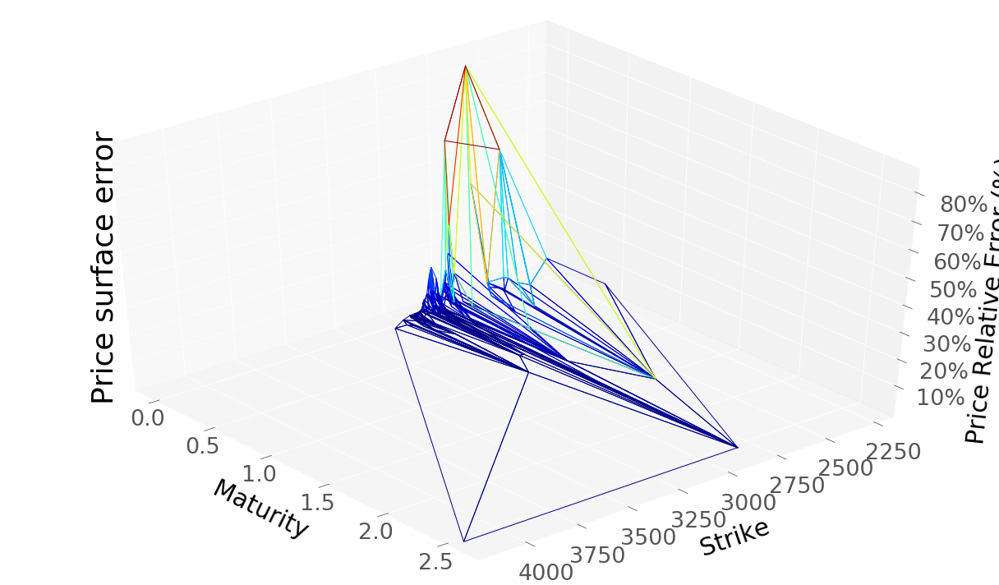

RMSE :  1.0403060889131148
RMSE Relative:  0.12292649094224603


In [38]:
impPriceTraining = plotTools.plotImpliedVolPrices(np.square(serieTrain)*serieTrain.index.get_level_values("Maturity"),
                                                  bootstrap, 
                                                  S0, 
                                                  dataSet,
                                                  yMin = KMin,
                                                  yMax = KMax, 
                                                  thresholdPrice = None)

In [39]:
ImpVolPutTrainingSSVI = BS.vectorizedImpliedVolatilityCalibration(S0, bootstrap, 
                                                                 dataSet["Maturity"], 
                                                                 dataSet["Strike"], 
                                                                 dataSet["OptionType"], 
                                                                 impPriceTraining,
                                                                 removeNaN = False)
ImpVolPutTrainingSSVI = pd.Series(ImpVolPutTrainingSSVI, index = dataSet.index).sort_index()

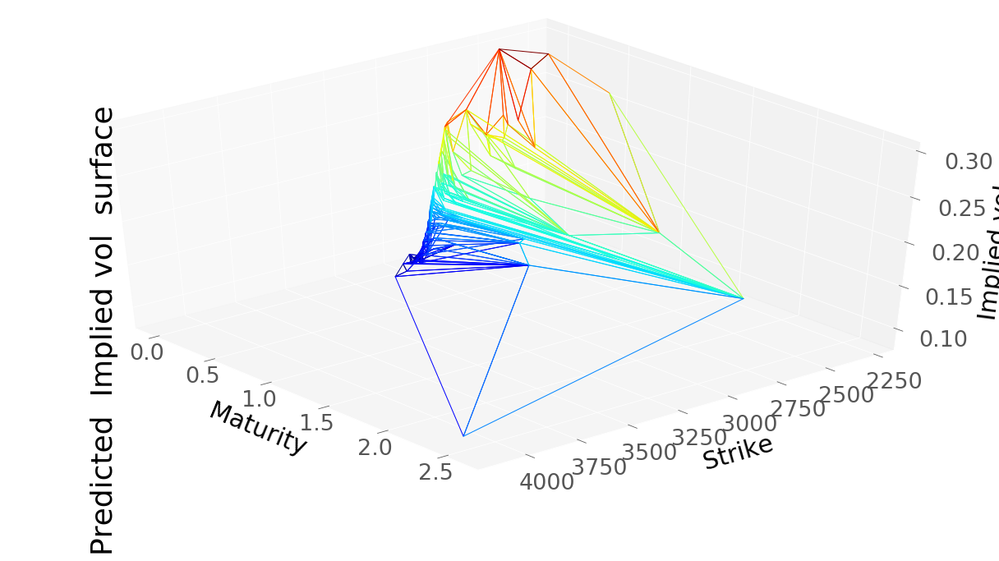

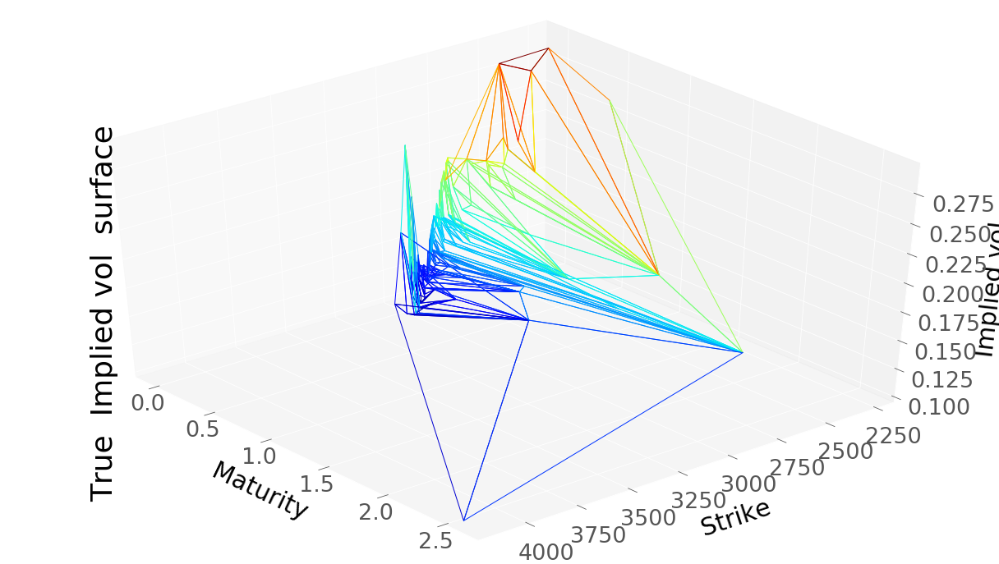

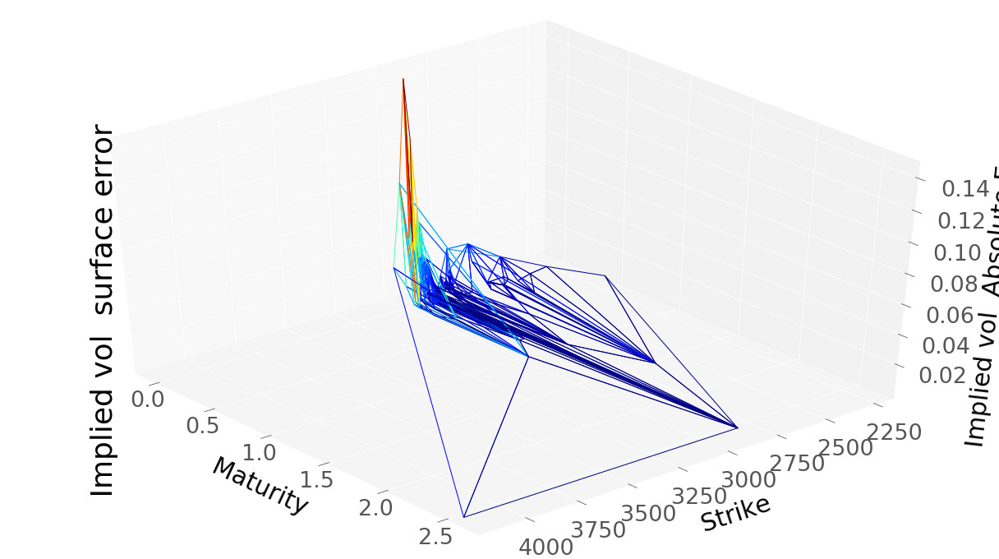

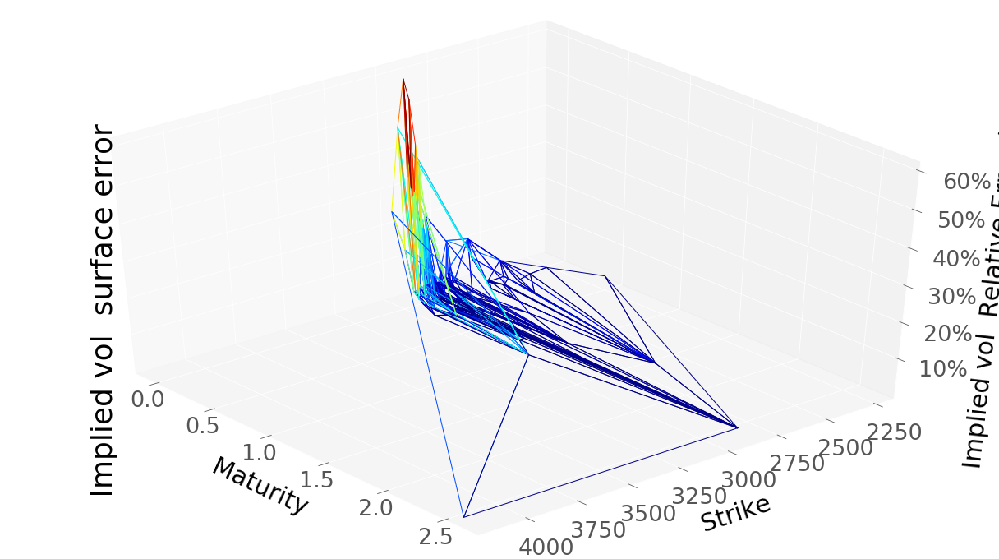

RMSE :  0.024301151861289744
RMSE Relative:  0.15264589663540792


In [40]:
keptPrices = dataSet["Price"][dataSet["Price"] >= 0.0].index
plotTools.predictionDiagnosis(plotTools.selectIndex(ImpVolPutTrainingSSVI, keptPrices) , 
                              plotTools.selectIndex(dataSet["ImpliedVol"], keptPrices) , 
                              " Implied vol ", 
                              yMin=KMin,
                              yMax=KMax)

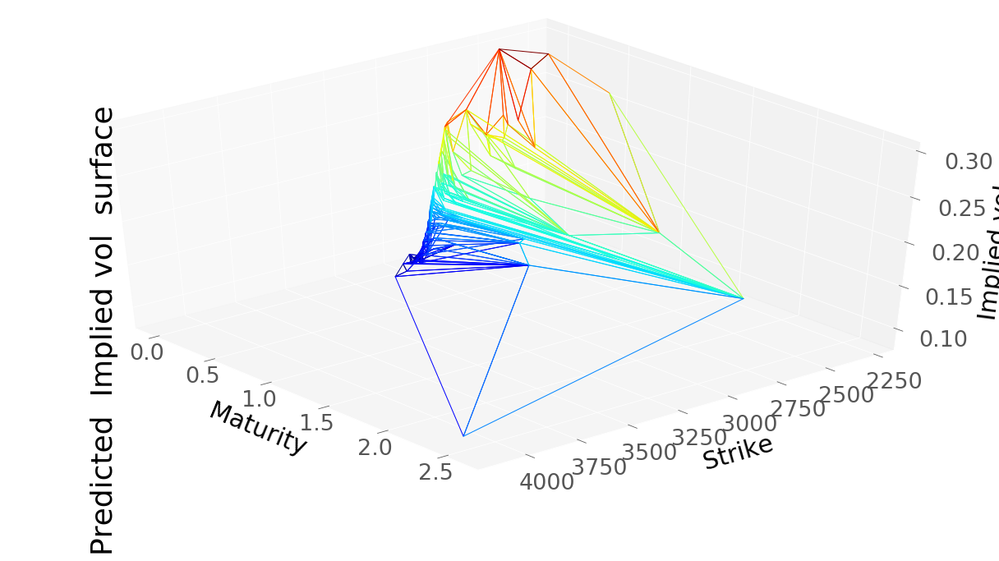

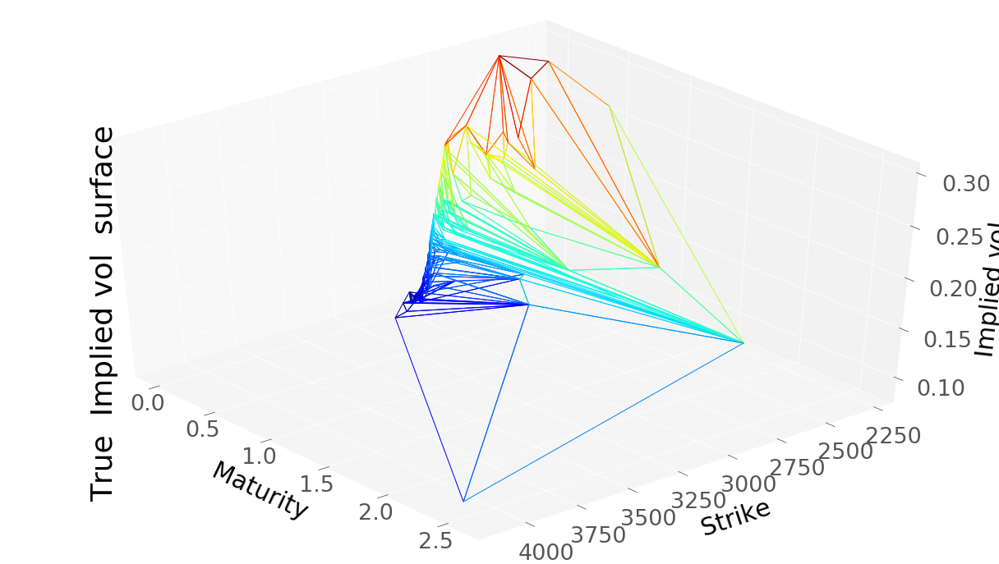

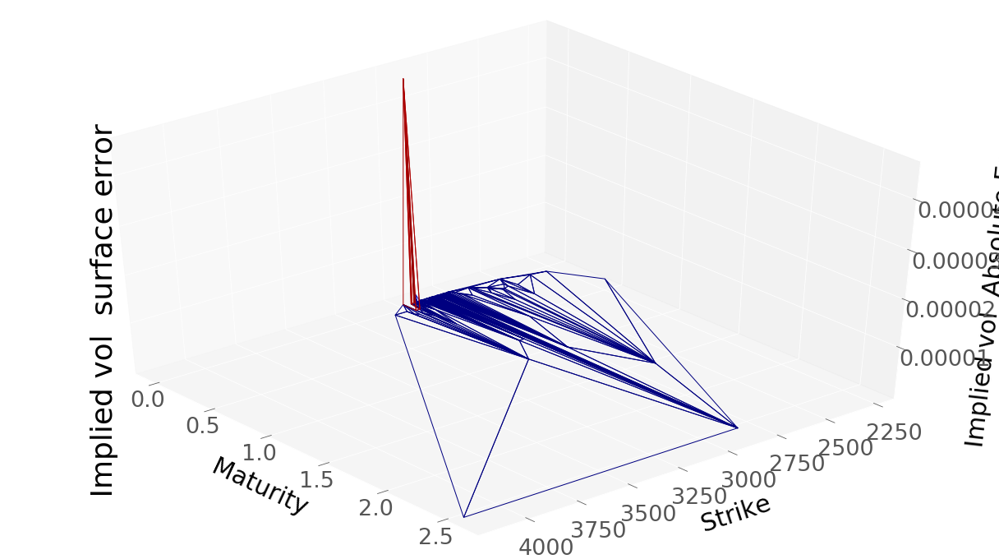

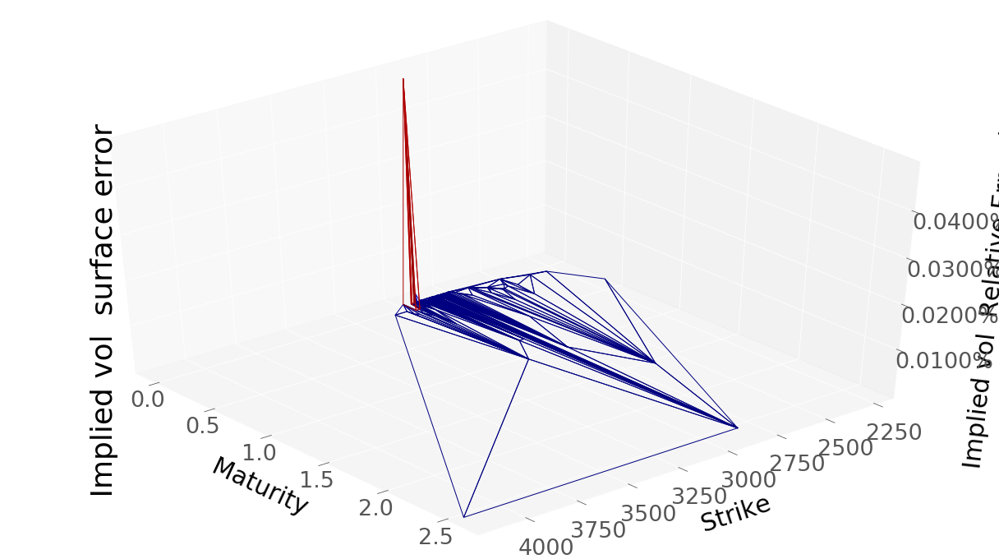

RMSE :  3.991953020697736e-06
RMSE Relative:  4.238967940302022e-05


In [41]:
keptPrices = dataSet["Price"][dataSet["Price"] >= 0.0].index
plotTools.predictionDiagnosis(plotTools.selectIndex(ImpVolPutTrainingSSVI, keptPrices), 
                              plotTools.selectIndex(serieTrain, keptPrices), 
                              " Implied vol ", 
                              yMin=KMin,
                              yMax=KMax)

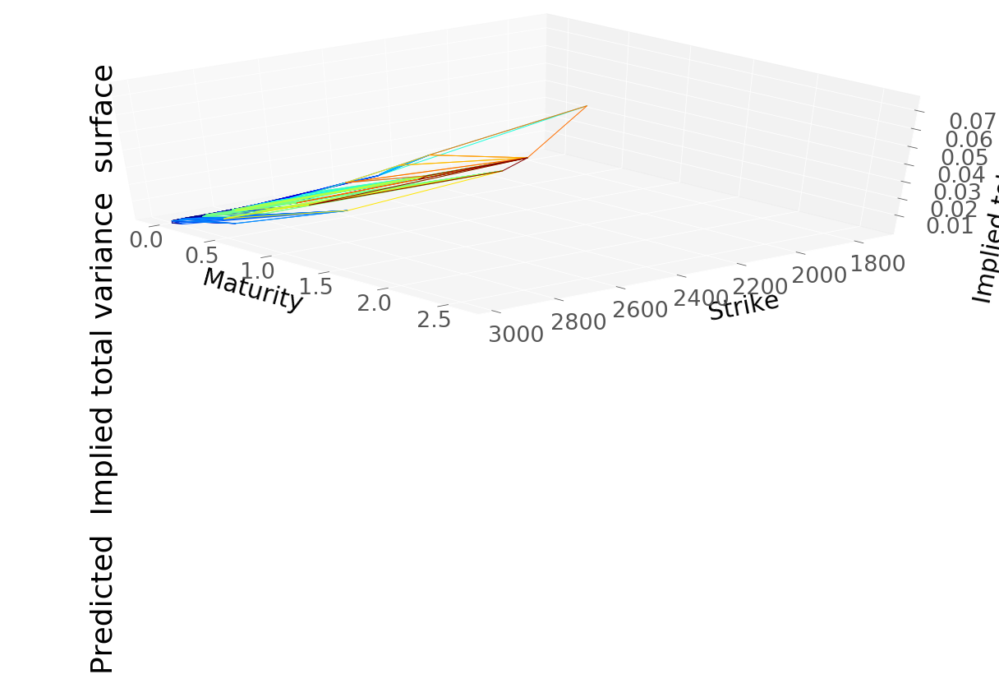

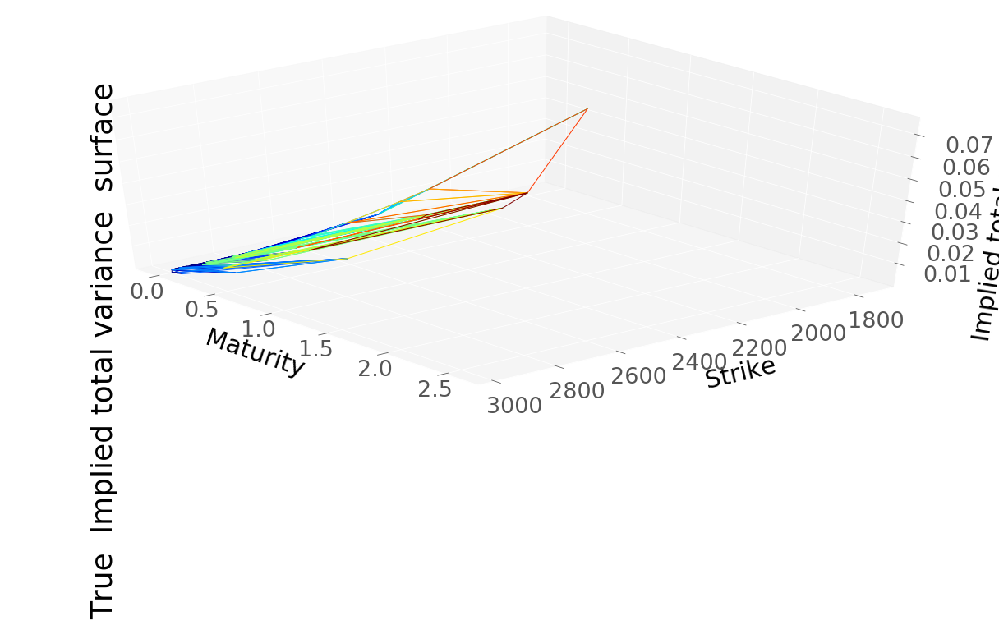

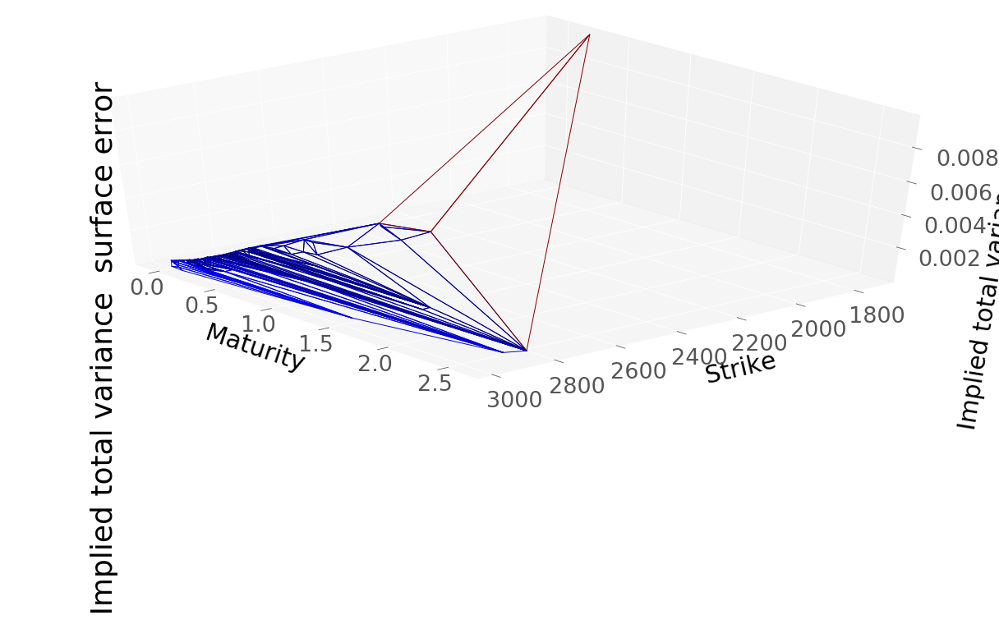

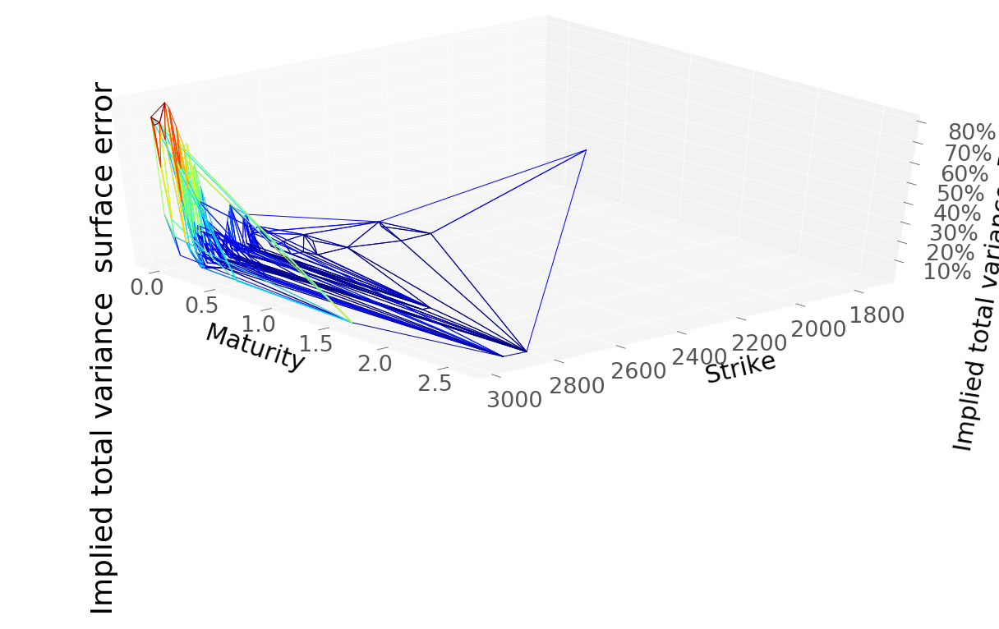

RMSE :  0.0008123076301225253
RMSE Relative:  0.2525041280941327


In [42]:
plotTools.predictionDiagnosis(SSVI.impliedVariance(serie), 
                              SSVI.impliedVariance(dataSetTest["ImpliedVol"]), 
                              " Implied total variance ", 
                              yMin=KMin, 
                              yMax=KMax)

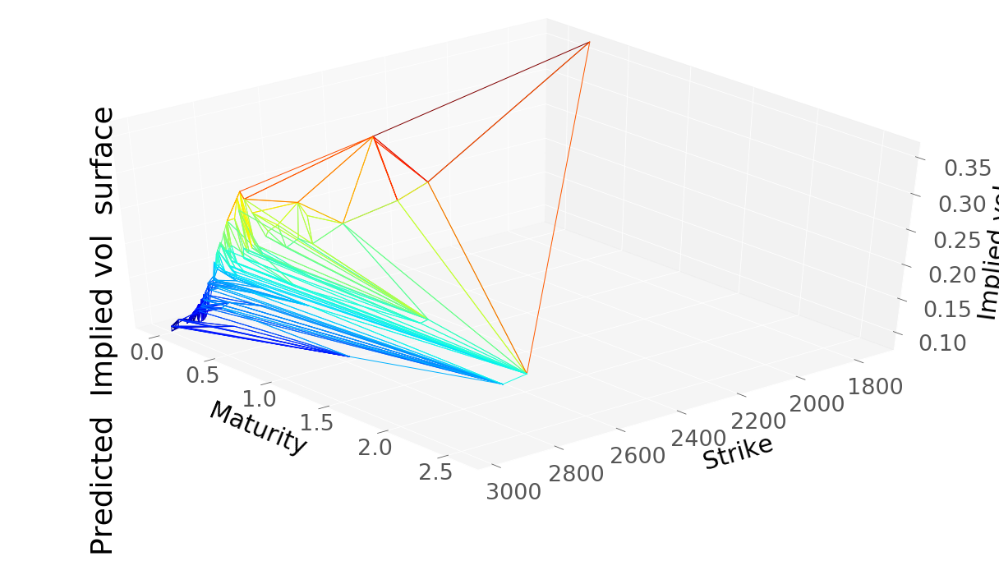

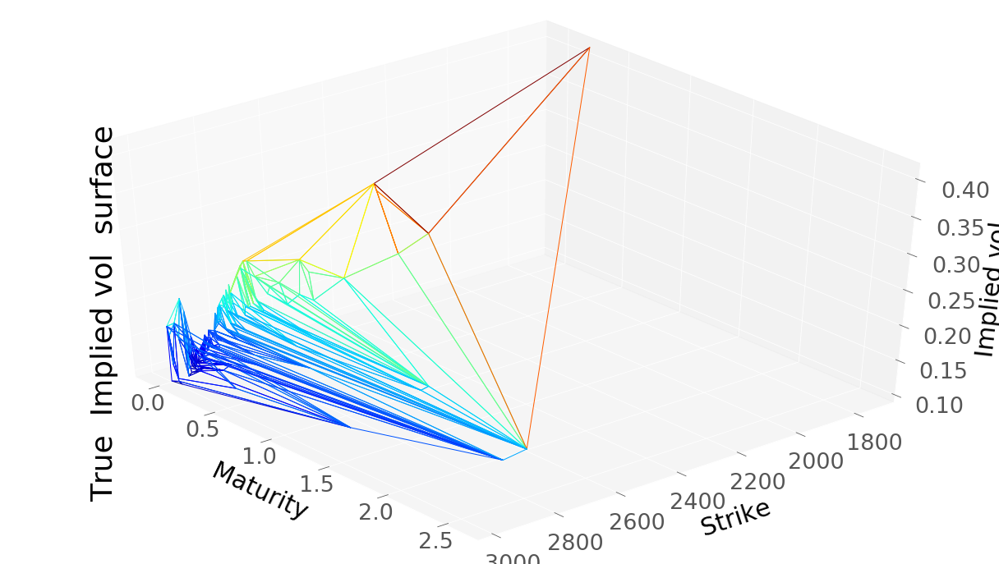

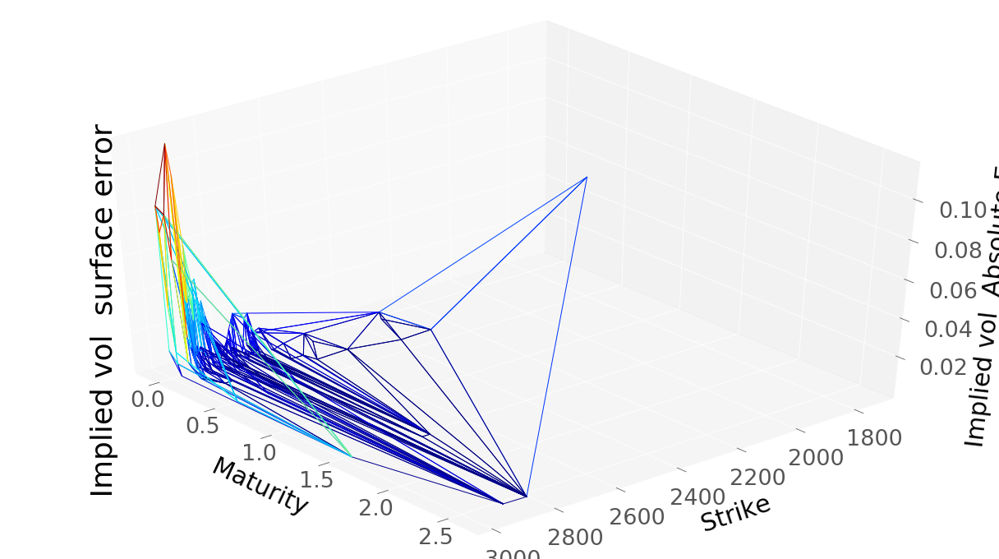

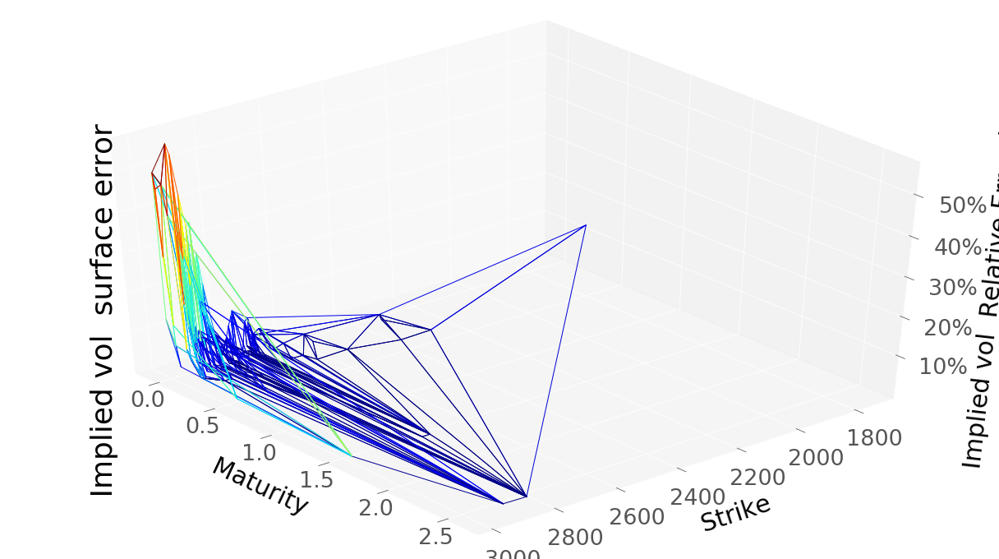

RMSE :  0.02405279979782294
RMSE Relative:  0.15521086251530805


In [43]:
keptPrices = dataSetTest["Price"][dataSetTest["Price"] >= 0.0].index
plotTools.predictionDiagnosis(plotTools.selectIndex(serie, keptPrices), 
                              plotTools.selectIndex(dataSetTest["ImpliedVol"], keptPrices), 
                              " Implied vol ", 
                              yMin=KMin,
                              yMax=KMax)

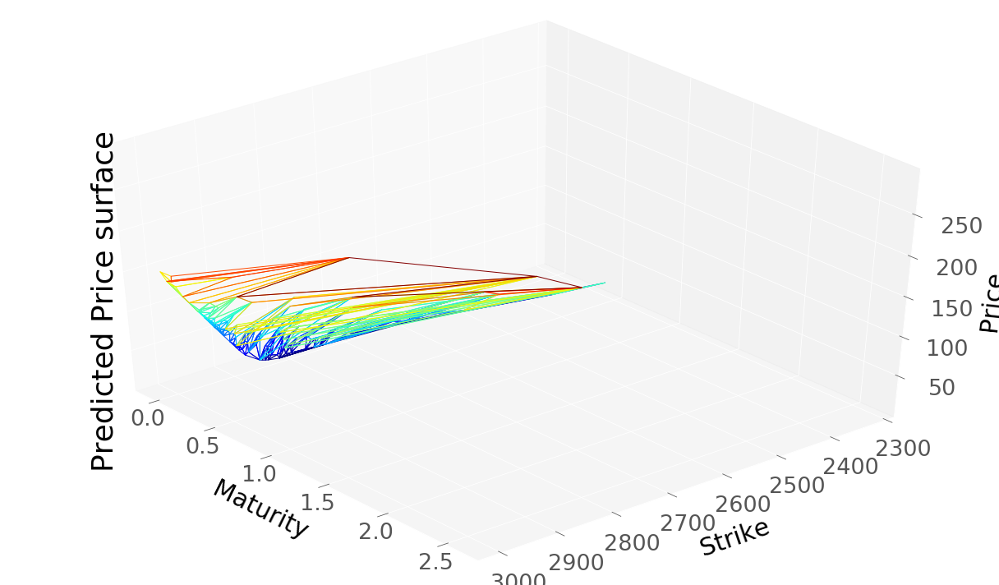

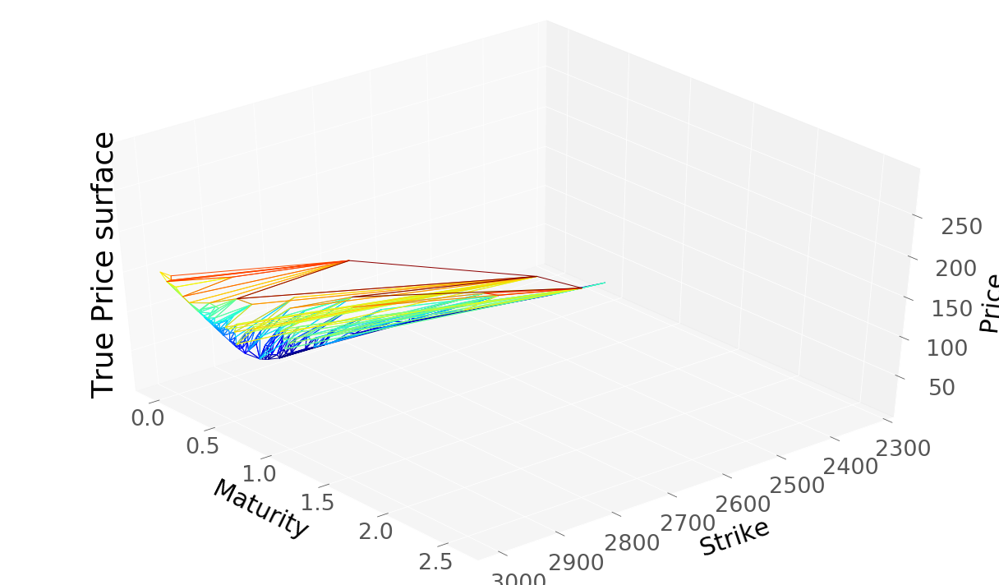

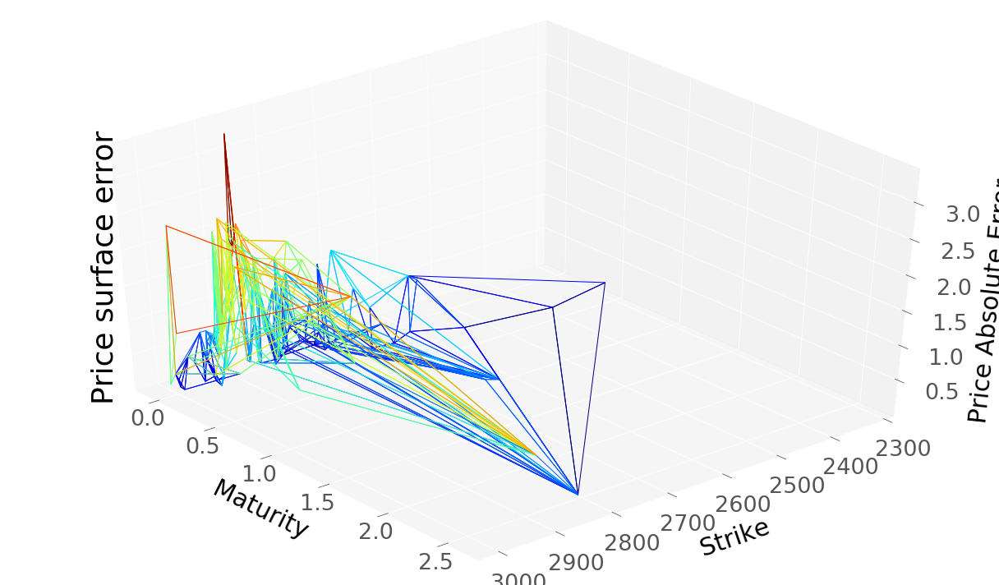

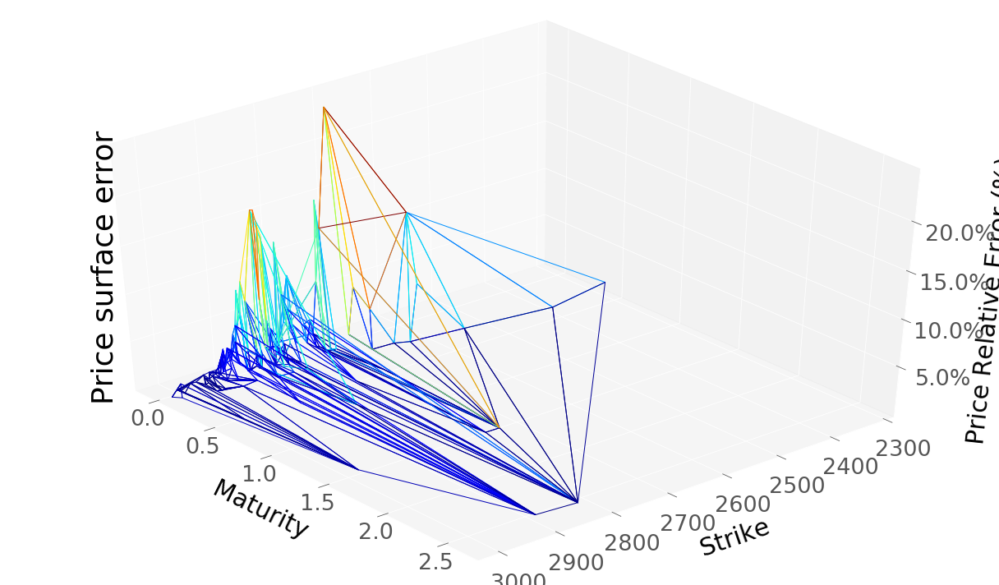

RMSE :  1.036134895426165
RMSE Relative:  0.04908796107157168


In [44]:
impPriceTesting = plotTools.plotImpliedVolPrices(np.square(serie)*serie.index.get_level_values("Maturity"), 
                                                 bootstrap, 
                                                 S0, 
                                                 dataSetTest,
                                                 yMin = KMin,
                                                 yMax = KMax, 
                                                 thresholdPrice = threshold)

In [45]:
ImpVolPutTestingSSVI = BS.vectorizedImpliedVolatilityCalibration(S0, bootstrap, 
                                                                 dataSetTest["Maturity"], 
                                                                 dataSetTest["Strike"], 
                                                                 dataSetTest["OptionType"], 
                                                                 impPriceTesting,
                                                                 removeNaN = False)
ImpVolPutTestingSSVI = pd.Series(ImpVolPutTestingSSVI, index = dataSetTest.index).sort_index()

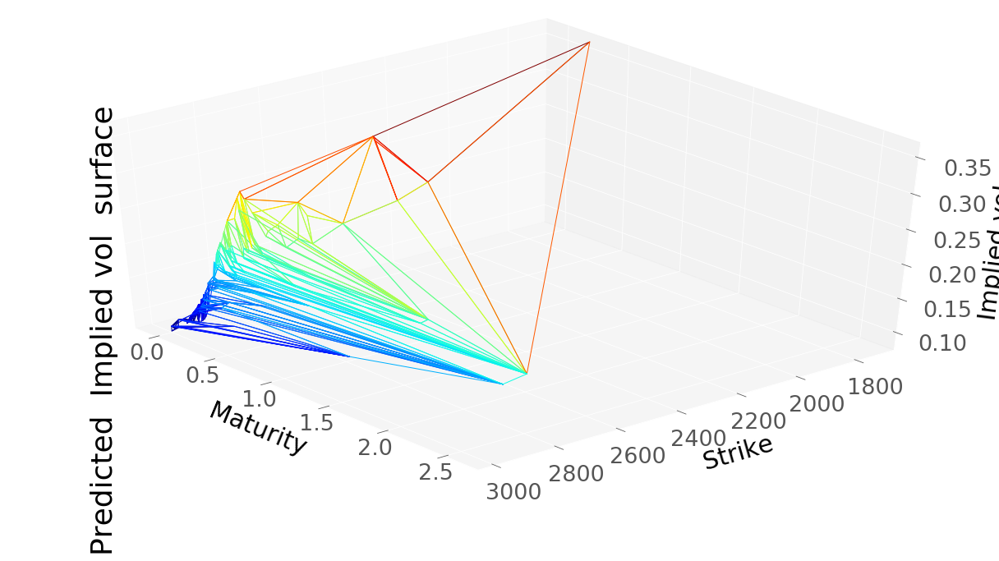

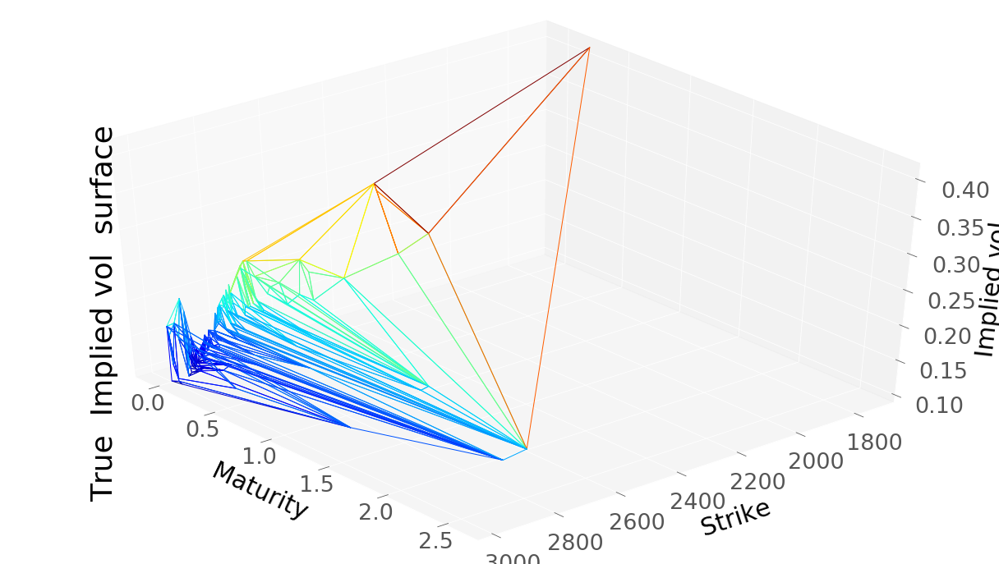

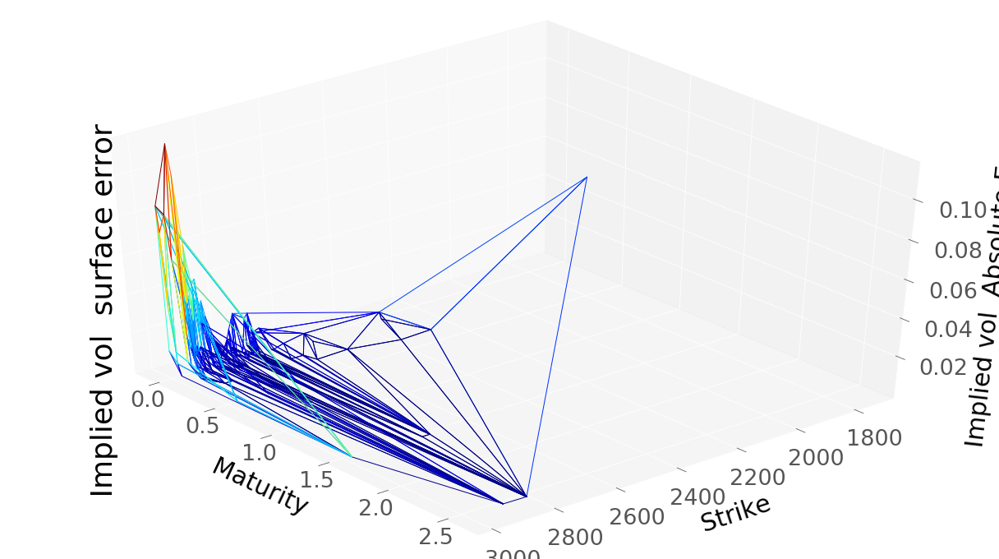

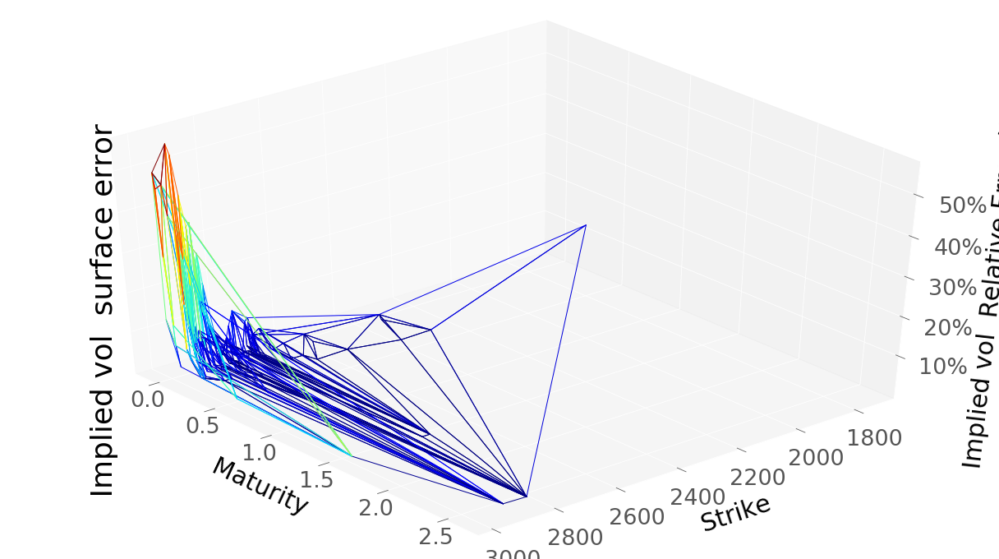

RMSE :  0.024052857536331056
RMSE Relative:  0.15521105859756537


In [46]:
keptPrices = dataSetTest["Price"][dataSetTest["Price"] >= 0.0].index
plotTools.predictionDiagnosis(plotTools.selectIndex(ImpVolPutTestingSSVI, keptPrices), 
                              plotTools.selectIndex(dataSetTest["ImpliedVol"], keptPrices), 
                              " Implied vol ", 
                              yMin=KMin,
                              yMax=KMax)

#### Estimate Local Volaitlity from SSVI

In [47]:
#dT, hk, dK, locVolSSVI, density = finiteDifferenceSVI(dataSet, interpolateWithSSVI)
dTTrain, hkTrain, dKTrain, locVolSSVITrain, densityTrain = SSVI.finiteDifferenceSVI(dataSet, SSVIModel.eval)

Number of arbitrage violations :  0
Arbitrable volatility :  Series([], Name: ImpliedVol, dtype: float64)
Interpolated Arbitrable volatility :  Series([], dtype: float64)


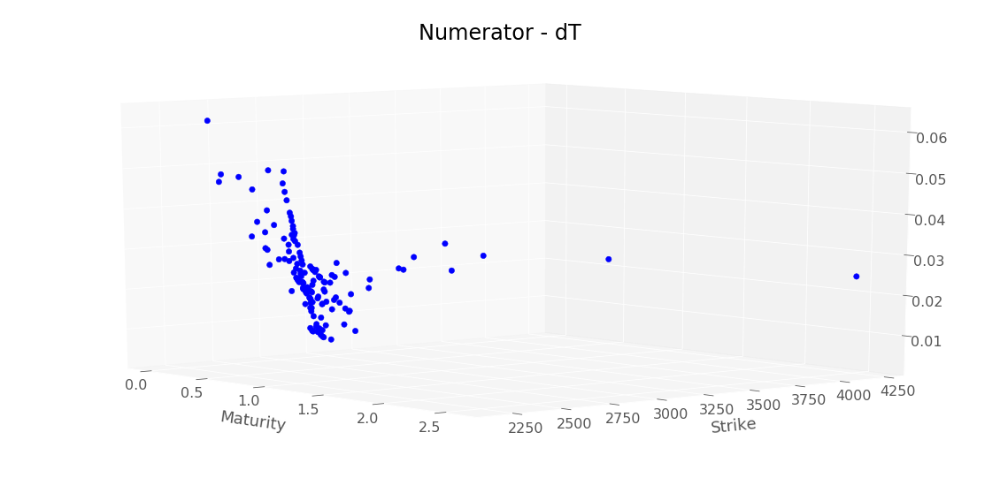

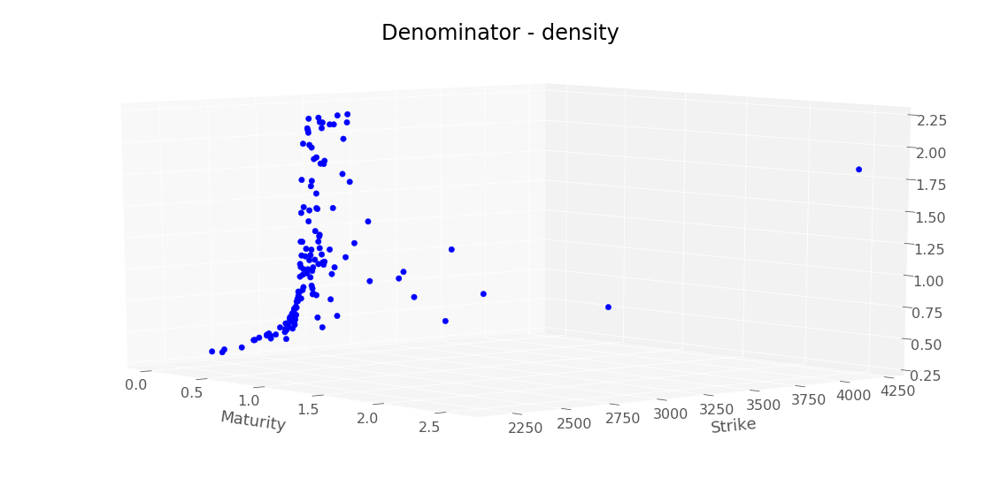

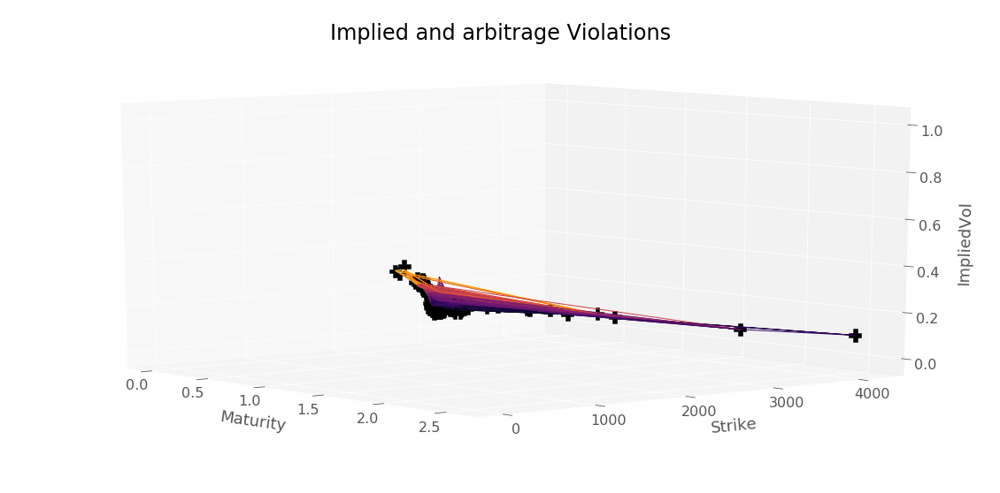

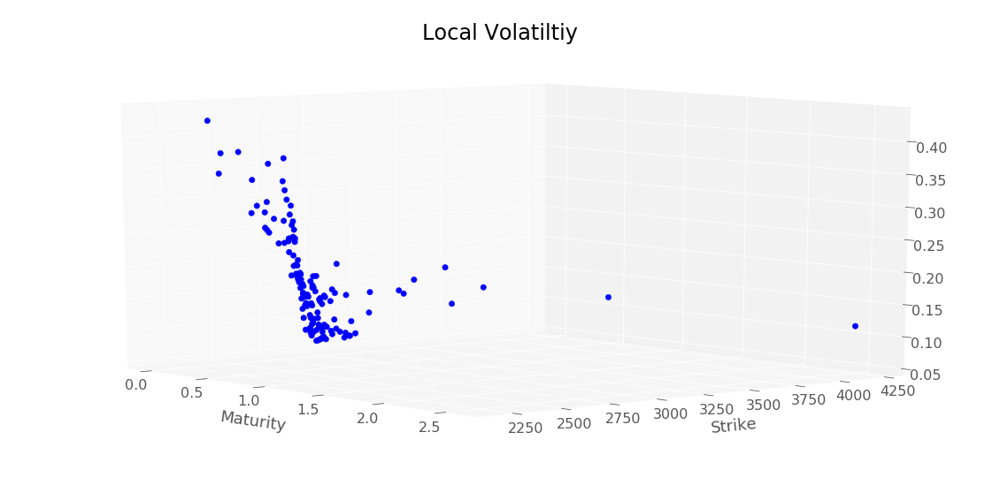

In [48]:
plotTools.diagnoseLocalVol(dTTrain,
                           locVolSSVITrain,
                           densityTrain,
                           SSVIModel.eval(dataSet),
                           dataSet,
                           az=320,
                           yMin=KMin,
                           yMax=KMax)

In [49]:
#dT, hk, dK, locVolSSVI, density = finiteDifferenceSVI(dataSet, interpolateWithSSVI)
dT, hk, dK, locVolSSVI, density = SSVI.finiteDifferenceSVI(dataSetTest, SSVIModel.eval)

Number of arbitrage violations :  0
Arbitrable volatility :  Series([], Name: ImpliedVol, dtype: float64)
Interpolated Arbitrable volatility :  Series([], dtype: float64)


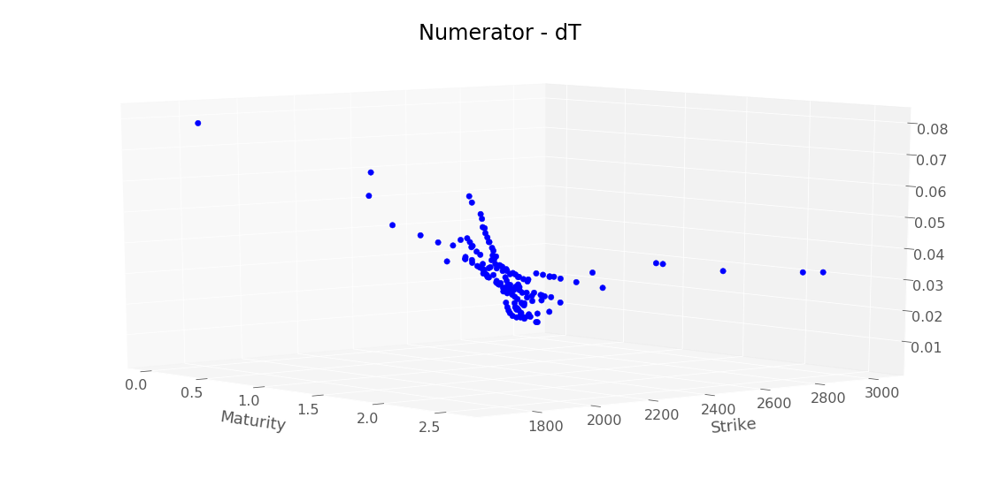

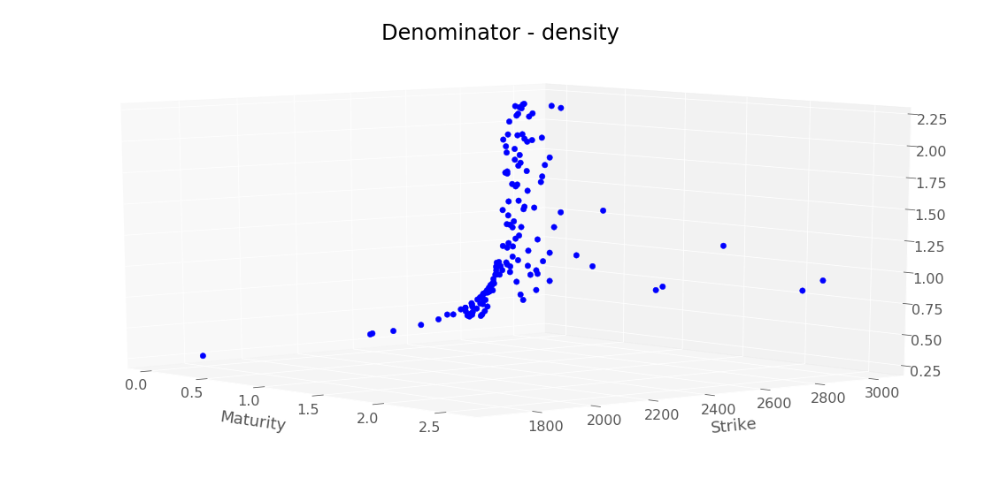

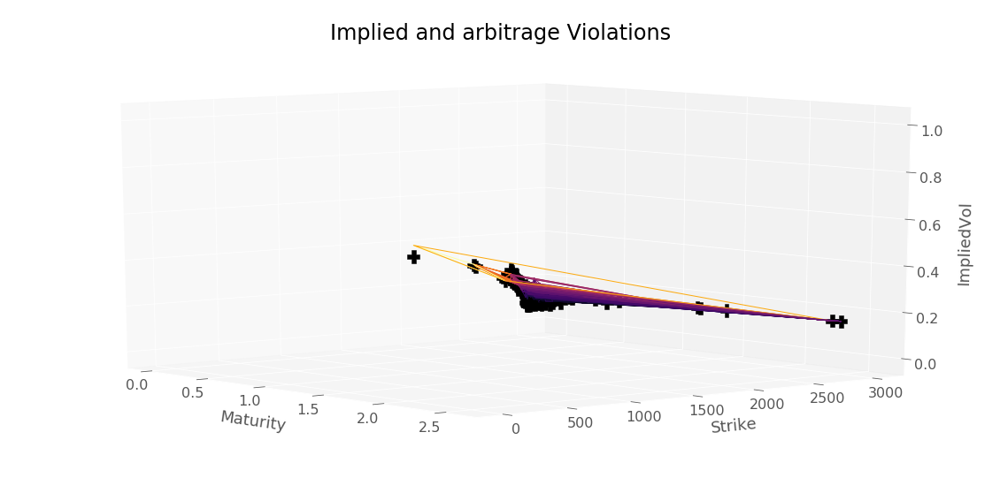

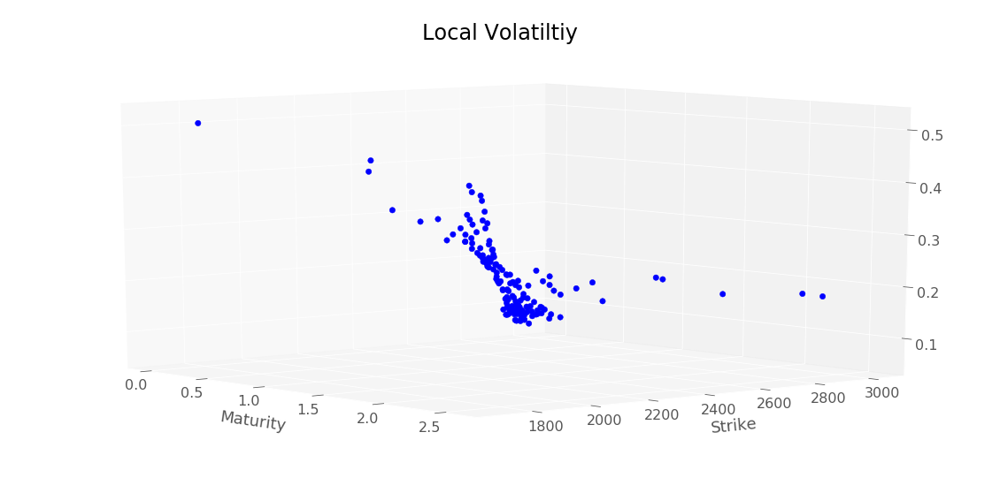

In [50]:
plotTools.diagnoseLocalVol(dT,
                           locVolSSVI,
                           density,
                           SSVIModel.eval(dataSetTest),
                           dataSetTest,
                           az=320,
                           yMin=KMin,
                           yMax=KMax)

In [51]:
plotTools.saveDataModel(plotTools.removeDuplicateIndex(impPriceTraining), 
                        plotTools.removeDuplicateIndex(locVolSSVITrain), 
                        plotTools.removeDuplicateIndex(serieTrain) , 
                        "./Results/SSVITraining") 

In [52]:
plotTools.saveDataModel(plotTools.removeDuplicateIndex(impPriceTesting), 
                        plotTools.removeDuplicateIndex(locVolSSVI), 
                        plotTools.removeDuplicateIndex(serie) , 
                        "./Results/SSVITesting") 

In [53]:
strikeLow = min(dataSet["Strike"].min(),dataSetTest["Strike"].min()) #dataSet["Strike"].min()
strikeUp = max(dataSet["Strike"].max(),dataSetTest["Strike"].max()) #dataSet["Strike"].max()
strikeGrid = np.linspace(strikeLow, strikeUp, 100)
matLow = min(dataSet["Maturity"].min(),dataSetTest["Maturity"].min()) #dataSet["Maturity"].min()
matUp = max(dataSet["Maturity"].max(),dataSetTest["Maturity"].max()) #dataSetTest["Maturity"].max()
matGrid = np.linspace(matLow, matUp, 100)
volLocaleGrid = np.meshgrid(strikeGrid, matGrid)
volLocaleGridDf = pd.DataFrame(np.vstack((np.ravel(volLocaleGrid[0]), np.ravel(volLocaleGrid[1]))).T, 
                               columns = ["Strike", "Maturity"]).set_index(["Strike","Maturity"],drop=False)
volLocaleGridDf["ChangedStrike"] = bootstrap.changeOfVariable(volLocaleGridDf["Strike"], volLocaleGridDf["Maturity"])[0]
volLocaleGridDf["logMoneyness"] = np.log(volLocaleGridDf["ChangedStrike"] / S0)
volLocaleGridDf["OptionType"] = np.ones_like(volLocaleGridDf["logMoneyness"])

In [205]:
dT, hk, dK, locVolSSVI, density = SSVI.finiteDifferenceSVI(volLocaleGridDf, SSVIModel.eval)

./code/SSVI.py:1105: RuntimeWarning: invalid value encountered in sqrt
  locVolGatheral = np.sqrt(dT / numerator)


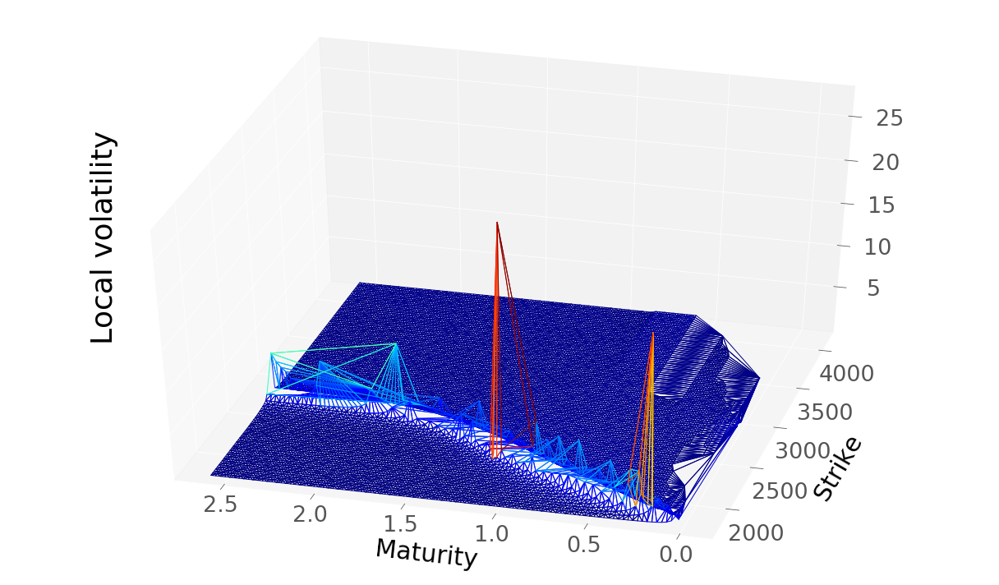

In [55]:
plotTools.plotSerie(locVolSSVI.dropna(),
                    yMin=KMin,
                    yMax=KMax, 
                    az=105,
                    Title = 'Local volatility')

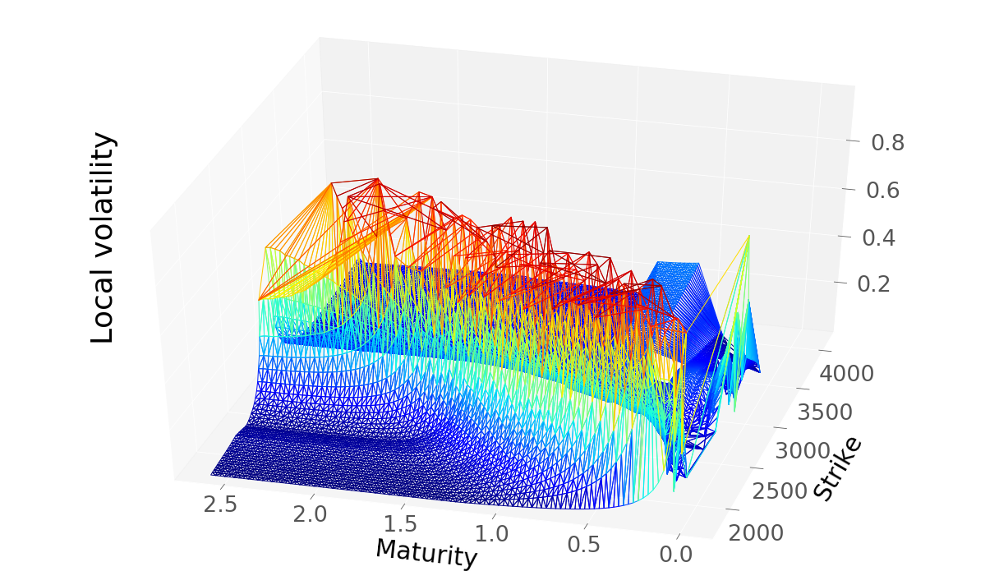

In [56]:
plotTools.plotSerie(locVolSSVI.dropna()[locVolSSVI.dropna() <= 1.0],
                    yMin=KMin,
                    yMax=KMax, 
                    az=105,
                    Title = 'Local volatility')

#### Backtest Local volatility SSVI 

In [49]:
nbTimeStep = 100
nbPaths = 100000

In [50]:
#dT, hk, dK, locVolSSVI, density = finiteDifferenceSVI(dataSet, interpolateWithSSVI)
dT, hk, dK, locVolSSVI, density = SSVI.finiteDifferenceSVI(dataSetTest, SSVIModel.eval)
nnSSVI = lambda x,y : backtest.interpolatedMCLocalVolatility(locVolSSVI, x, y)

NameError: name 'interpolationBind' is not defined

In [73]:
strikeLow = min(dataSet["Strike"].min(),dataSetTest["Strike"].min()) #dataSet["Strike"].min()
strikeUp = max(dataSet["Strike"].max(),dataSetTest["Strike"].max()) #dataSet["Strike"].max()
strikeGrid = np.linspace(strikeLow, strikeUp, 100)
matLow = min(dataSet["Maturity"].min(),dataSetTest["Maturity"].min()) #dataSet["Maturity"].min()
matUp = max(dataSet["Maturity"].max(),dataSetTest["Maturity"].max()) #dataSetTest["Maturity"].max()
matGrid = np.linspace(matLow, matUp, 100)
volLocaleGrid = np.meshgrid(strikeGrid, matGrid)
volLocaleGridDf = pd.DataFrame(np.vstack((np.ravel(volLocaleGrid[0]), np.ravel(volLocaleGrid[1]))).T, 
                               columns = ["Strike", "Maturity"]).set_index(["Strike","Maturity"],drop=False)
volLocaleGridDf["ChangedStrike"] = bootstrap.changeOfVariable(volLocaleGridDf["Strike"], volLocaleGridDf["Maturity"])[0]
volLocaleGridDf["logMoneyness"] = np.log(volLocaleGridDf["ChangedStrike"] / S0)
volLocaleGridDf["OptionType"] = np.ones_like(volLocaleGridDf["logMoneyness"])

In [99]:
volLocaleGridDf.head()

,,Strike,Maturity,ChangedStrike,logMoneyness,OptionType
Strike,Maturity,,,,,
1700.000000,0.005,1700.000000,0.005,1698.937070,-0.520654,1.0
1725.252525,0.005,1725.252525,0.005,1724.173806,-0.505909,1.0
1750.505051,0.005,1750.505051,0.005,1749.410542,-0.491378,1.0
1775.757576,0.005,1775.757576,0.005,1774.647278,-0.477056,1.0
1801.010101,0.005,1801.010101,0.005,1799.884015,-0.462935,1.0


In [100]:
#dT, hk, dK, locVolSSVI, density = finiteDifferenceSVI(dataSet, interpolateWithSSVI)
dT2, hk2, dK2, locVolSSVI2, density2 = SSVI.finiteDifferenceSVI(volLocaleGridDf, SSVIModel.eval)
cleanValue = ~(dT2.isna() | density2.isna() | (dT2 < 0) | (density2 < 0) )
dT2 = dT2[cleanValue.values]
density2 = density2[cleanValue.values]
hk2 = hk2[cleanValue.values]
locVolSSVI2 = locVolSSVI2[cleanValue.values]
dK2 = dK2[cleanValue.values]

nnSSVI2 = lambda x,y : backtest.interpolatedMCLocalVolatility(locVolSSVI2, x, y)

./code/SSVI.py:1105: RuntimeWarning: invalid value encountered in sqrt
  locVolGatheral = np.sqrt(dT / numerator)


In [101]:
mcResSSVITest = backtest.MonteCarloPricerVectorized(S0,
                                                    dataSetTest,
                                                    bootstrap,
                                                    nbPaths,
                                                    nbTimeStep,
                                                    nnSSVI)
mcResSSVITest.head()

Price   stdPrice
Strike Maturity                      
1700.0 0.246      0.122353   5.334149
2300.0 0.419     13.060788  78.424282
2350.0 0.093      0.566051   9.872014
       0.112      1.066521  15.021875
2400.0 0.419     19.244920  94.333650

In [102]:
mcResSSVITest.to_csv(workingFolder + "mcResSSVITest.csv")

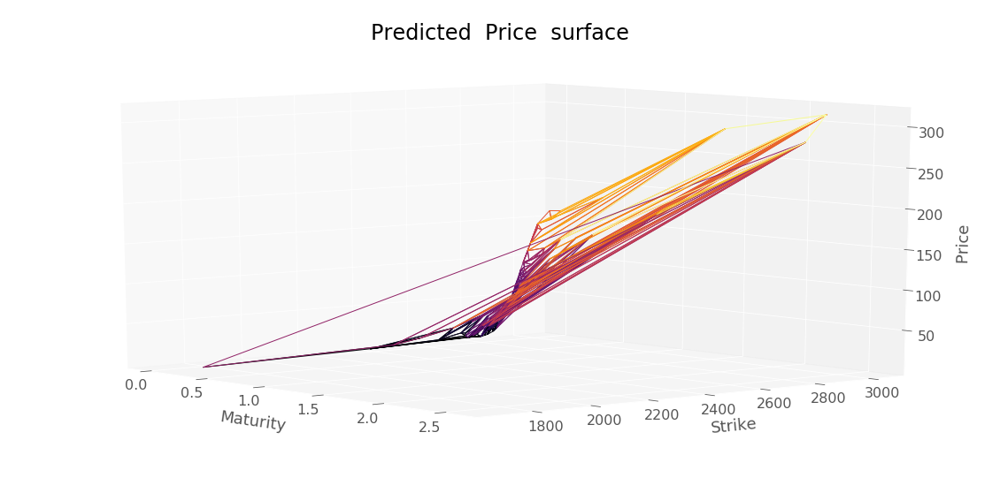

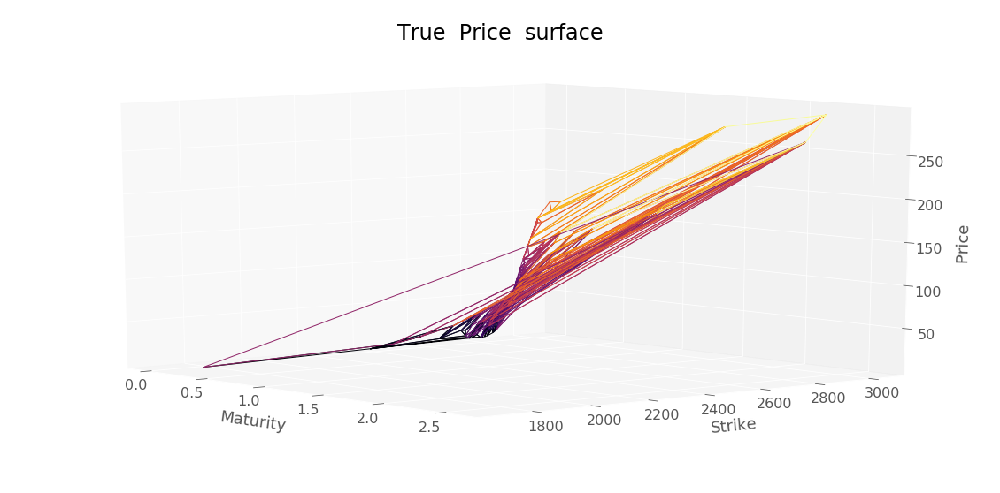

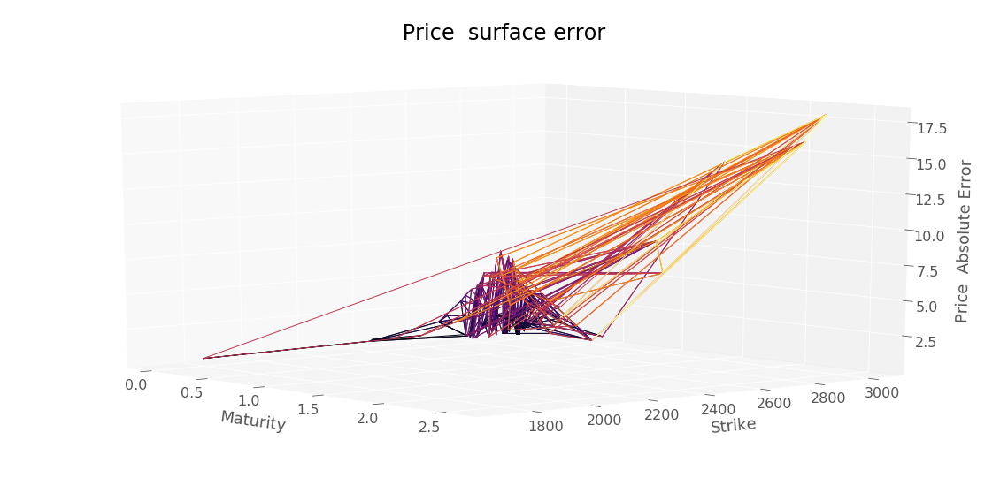

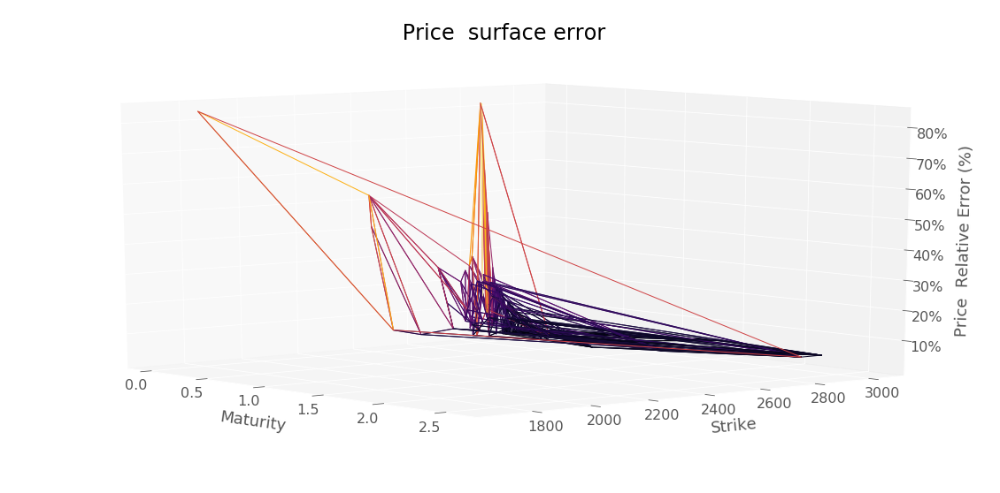

RMSE :  3.6637683766331297


In [103]:
plotTools.predictionDiagnosis(mcResSSVITest["Price"], 
                              dataSetTest["Price"], 
                              " Price ", 
                              yMin=KMin,
                              yMax=KMax)

In [104]:
mcResSSVITest2 = backtest.MonteCarloPricerVectorized(S0,
                                                     dataSetTest,
                                                     bootstrap,
                                                     nbPaths,
                                                     nbTimeStep,
                                                     nnSSVI2)
mcResSSVITest2.head()

Price    stdPrice
Strike Maturity                       
1700.0 0.246      1.455696   24.869698
2300.0 0.419     25.588542  123.812386
2350.0 0.093     14.016421   68.642720
       0.112     14.416882   70.318307
2400.0 0.419     37.626466  144.725427

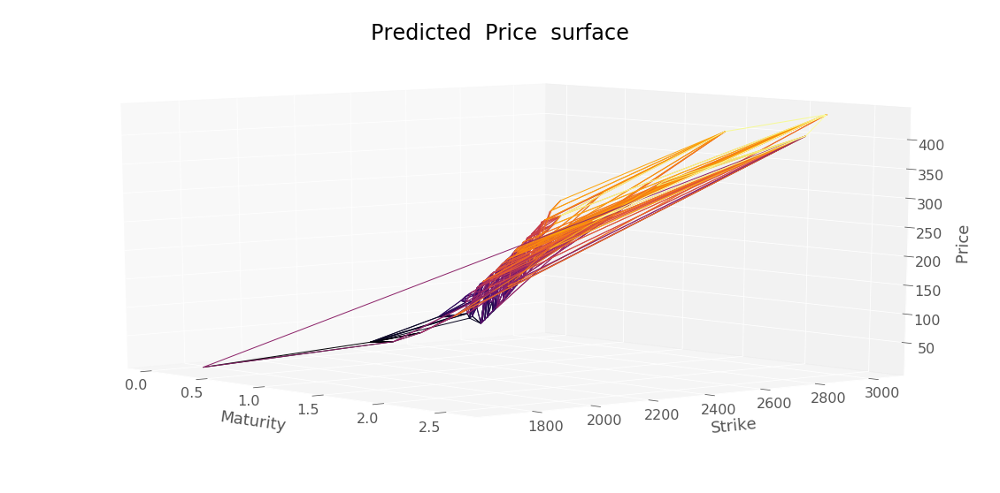

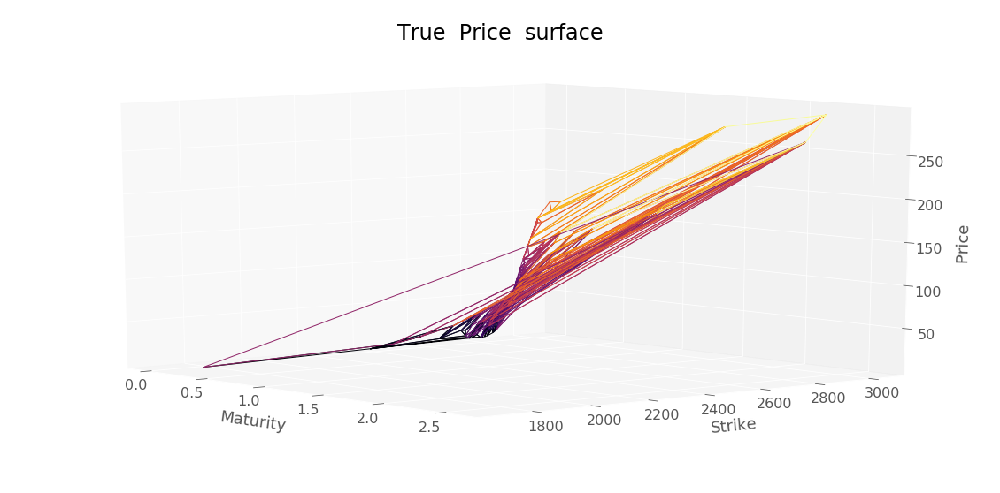

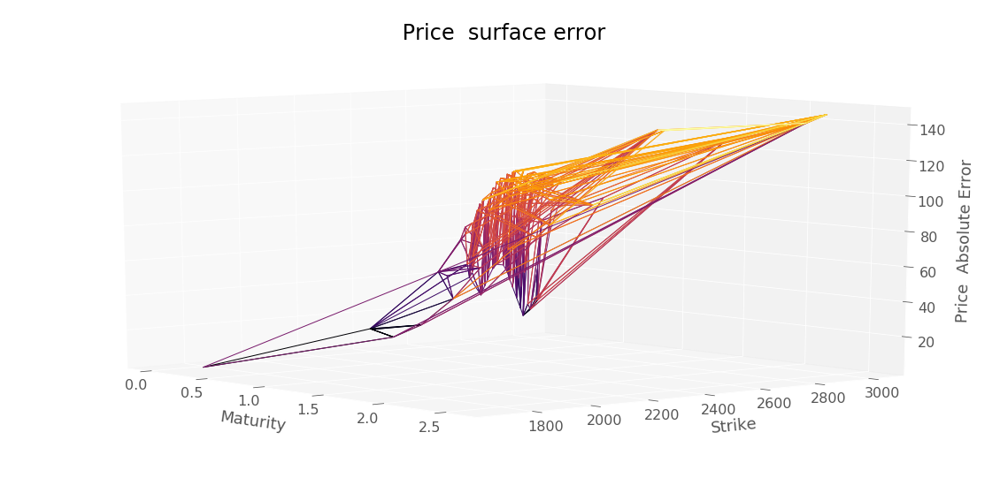

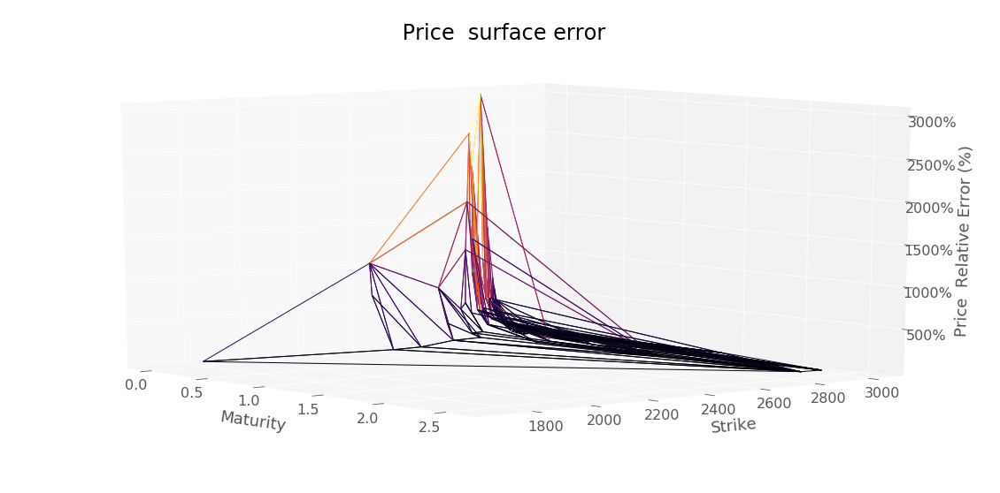

RMSE :  73.14936573655442


In [105]:
plotTools.predictionDiagnosis(mcResSSVITest2["Price"], 
                              dataSetTest["Price"], 
                              " Price ", 
                              yMin=KMin,
                              yMax=KMax)

In [106]:
mcResSSVITest2.to_csv(workingFolder + "mcResSSVITest2.csv")

plotTools.plotSerie(testingDataSetSSVI[testingDataSetSSVI.index.get_level_values("Maturity") > 0.01],
                    Title = 'SSVI Local Volatility Surface',
                    az=30,
                    yMin=0.0*S0,
                    yMax=2.0*S0, 
                    zAsPercent=True)

In [108]:
pdeResSigmaSSVITest = backtest.PDEPricerVectorized(dataSetTest, S0, nnSSVI, bootstrap)
pdeResSigmaSSVITest.head()

Strike  Maturity
1700.0  0.246        0.098625
2300.0  0.419       12.187299
2350.0  0.093        0.473528
        0.112        0.777455
2400.0  0.419       18.238733
dtype: float64

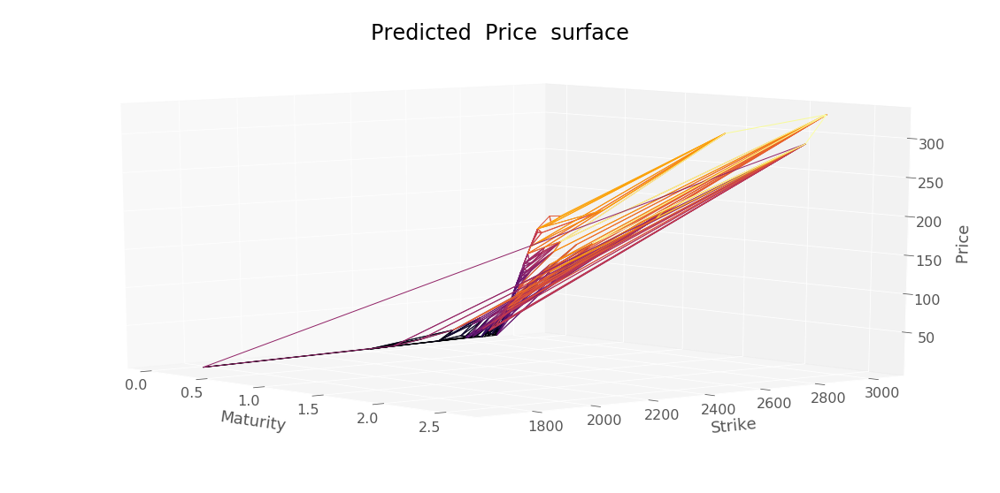

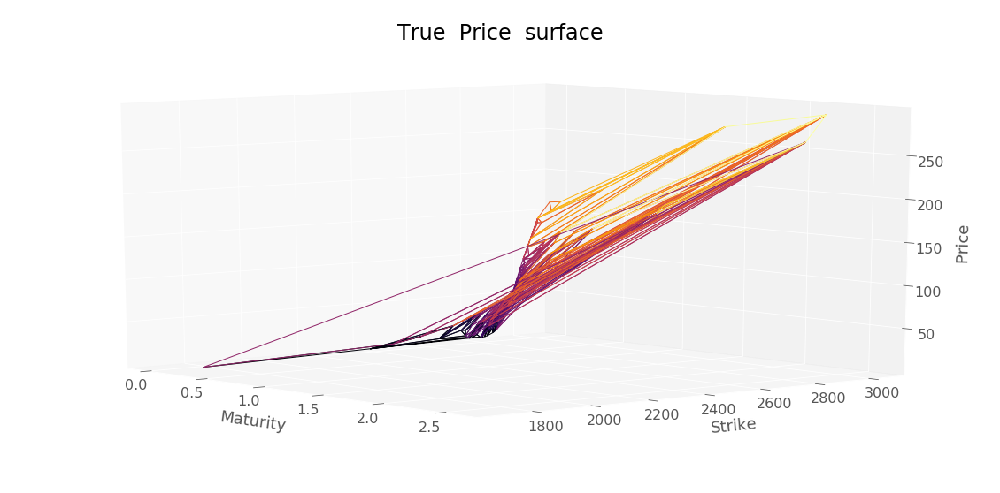

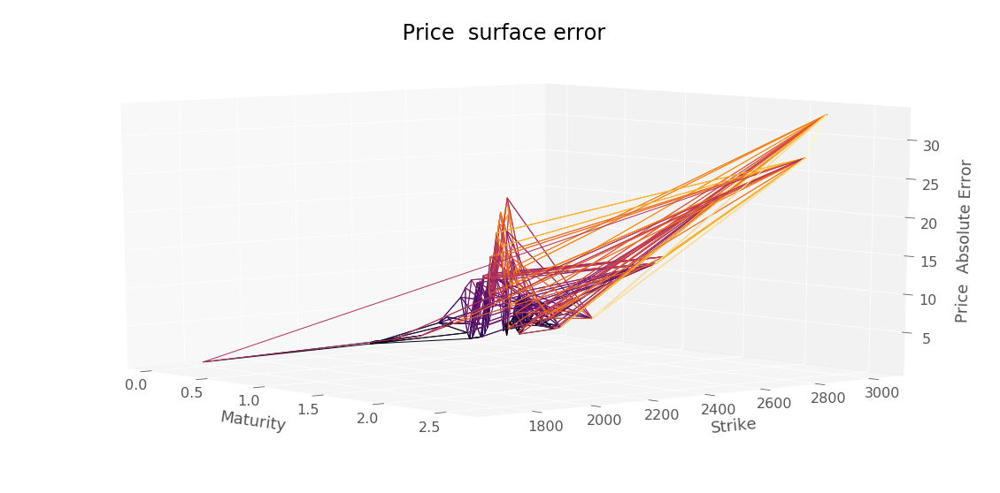

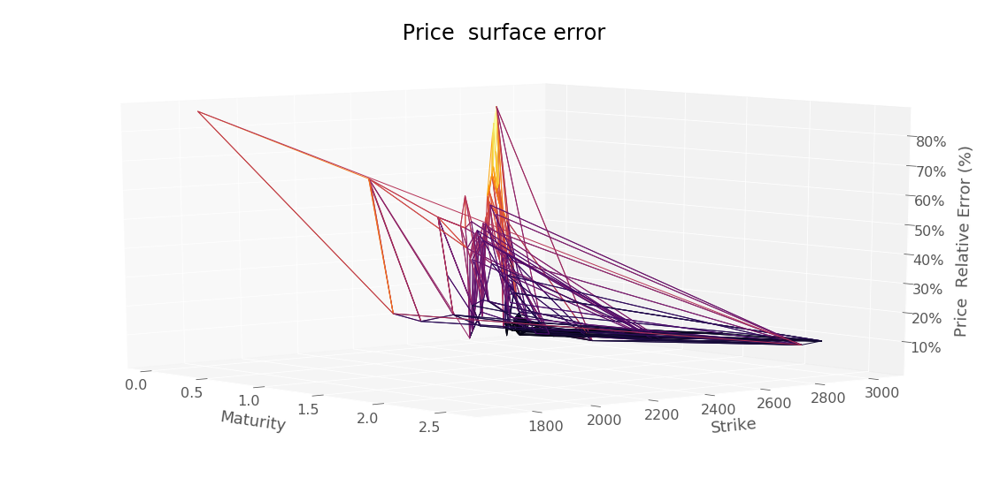

RMSE :  7.7195335495888076


In [109]:
plotTools.predictionDiagnosis(pdeResSigmaSSVITest, 
                              dataSetTest["Price"], 
                              " Price ", 
                              yMin=KMin,
                              yMax=KMax)

In [110]:
pdeResSigmaSSVITest.to_csv(workingFolder + "pdeResSigmaSSVITest.csv")

/home/chataigner/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: FutureWarning: The signature of `Series.to_csv` was aligned to that of `DataFrame.to_csv`, and argument 'header' will change its default value from False to True: please pass an explicit value to suppress this warning.
  """Entry point for launching an IPython kernel.


In [111]:
pdeResSigmaSSVITest2 = backtest.PDEPricerVectorized(dataSetTest, S0, nnSSVI2, bootstrap)
pdeResSigmaSSVITest2.head()

Strike  Maturity
1700.0  0.246       15.870643
2300.0  0.419       27.919080
2350.0  0.093       21.050400
        0.112       22.446631
2400.0  0.419       29.619586
dtype: float64

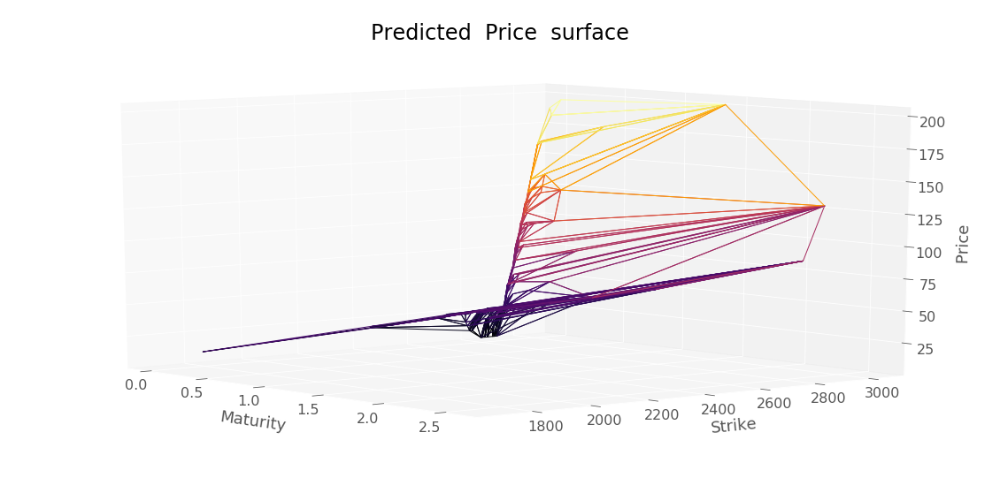

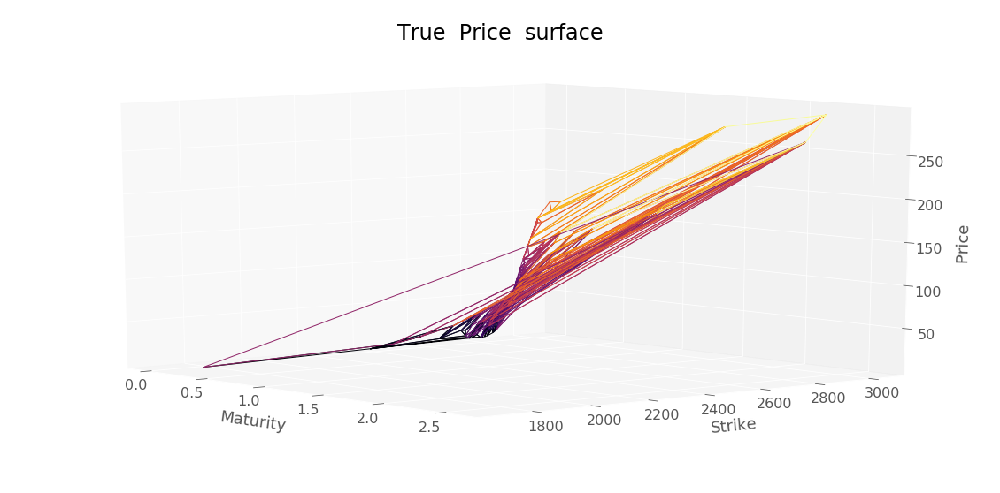

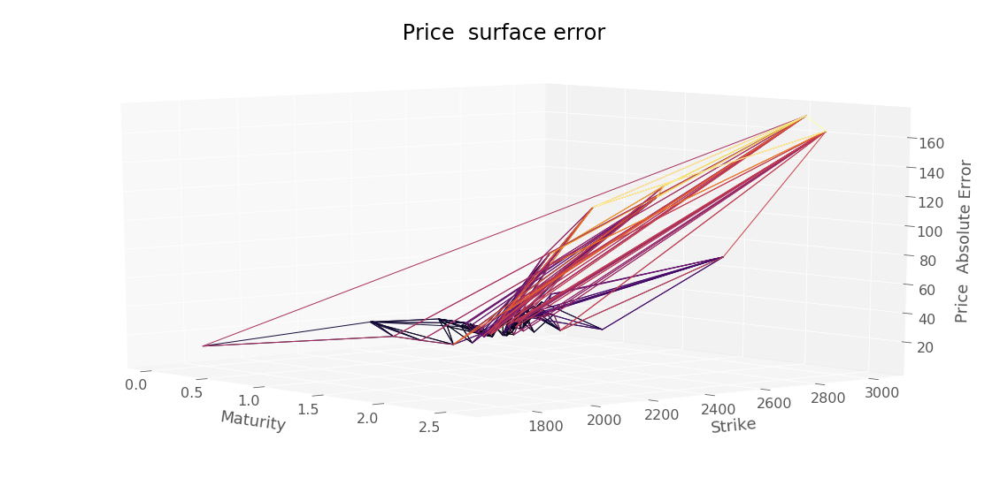

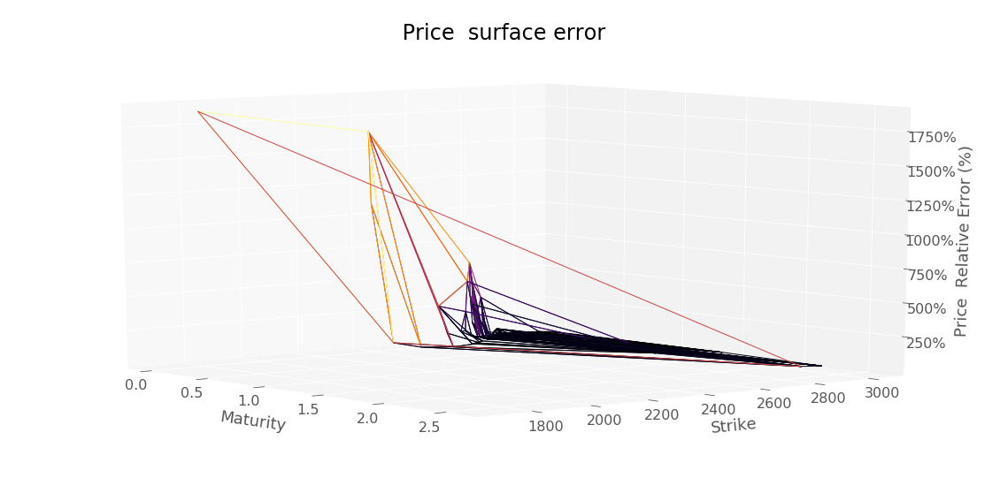

RMSE :  31.508738588079186


In [112]:
plotTools.predictionDiagnosis(pdeResSigmaSSVITest2, 
                              dataSetTest["Price"], 
                              " Price ", 
                              yMin=KMin,
                              yMax=KMax)

In [113]:
pdeResSigmaSSVITest2.to_csv(workingFolder + "pdeResSigmaSSVITest2.csv")

/home/chataigner/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: FutureWarning: The signature of `Series.to_csv` was aligned to that of `DataFrame.to_csv`, and argument 'header' will change its default value from False to True: please pass an explicit value to suppress this warning.
  """Entry point for launching an IPython kernel.
